Document Link : 

<a id='INDEX'></a>
# Index

[Clustering might help](#Clustering)      
[Align 2019-2020 Emission values with 2021](#Tweaking_Extrapolating)      
[NMF Decomposition](#NMF_Decomposition)      
[Important Comment on NMF Decomposition](#Comment_on_NMF_Decomposition)      
[EDA which makes sense](#Complete_EDA)      

<a id='Clustering'></a>
[INDEX](#INDEX)
## Clustering might help
(By: CHUN FU)
Notebook 1

Source - https://www.kaggle.com/code/patrick0302/clustering-might-help

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns


###############

# import plotly.graph_objs as go
# import plotly
# from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
# import cufflinks as cf
# cf.set_config_file(offline=True)

In [2]:
raw_df = pd.read_csv('train.csv')
train = raw_df.copy()
train.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


In [ ]:
### Removingthose two outlier coordinate

# print(train.shape)

# # Removing these 2 coordinates as a outliers
# train = train[(~(train['latitude'] == -2.079)) & (~(train['latitude'] == -2.378))]
# print(train.shape)

In [3]:
df = train.copy()

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

def kmeans_clustering(df, cluster_num, max_iter):
    scaler = StandardScaler()
    df_scaled = pd.DataFrame(scaler.fit_transform(df), index = df.index, columns = df.columns)
    
    kmean_model = KMeans(n_clusters=cluster_num, max_iter=max_iter, random_state=101)
    kmean_model.fit(df_scaled)
    
    cluster_df = pd.DataFrame(kmean_model.labels_, index = df.index, columns = ['Cluster No'])
    
    return cluster_df

In [5]:
emission_series = df.pivot_table(index=['year','week_no'], columns=['longitude', 'latitude'], values = 'emission')
emission_series = (emission_series - emission_series.min()) / (emission_series.max() - emission_series.min())  #MinMaxScaler
emission_series = emission_series.dropna(axis = 1)
emission_series

longitude       28.228    28.249    28.297    28.306    28.311    28.353  \
latitude        -2.972    -2.451    -1.903    -2.794    -2.589    -2.447   
year week_no                                                               
2019 0        0.733708  0.830925  0.813391  0.830925  0.324295  0.830925   
     1        0.754184  0.824839  0.877999  0.824839  0.426328  0.824839   
     2        0.744222  0.785891  0.893758  0.785892  0.512901  0.785891   
     3        0.764801  0.803512  0.926404  0.803512  0.538294  0.803512   
     4        0.740787  0.775843  0.938527  0.775843  0.531764  0.775843   
...                ...       ...       ...       ...       ...       ...   
2021 48       0.594657  0.508997  0.726488  0.508997  0.812097  0.508997   
     49       0.588665  0.508367  0.717296  0.508367  0.790073  0.508367   
     50       0.599439  0.537965  0.738872  0.537965  0.737149  0.537965   
     51       0.593237  0.540394  0.689163  0.540394  0.704344  0.540394   
     52       0.551775  0.525252  0.668031  0.525252  0.587004  0.525251   

longitude       28.364    28.380    28.398    28.404  ...    31.396    31.397  \
latitude        -1.536    -2.820    -1.902    -2.096  ...    -1.004    -1.203   
year week_no                                          ...                       
2019 0        0.830925  0.570356  0.804066  0.830925  ...  0.095630  0.627200   
     1        0.824839  0.731038  0.806220  0.824839  ...  0.197720  0.780831   
     2        0.785892  0.839829  0.776130  0.785892  ...  0.286173  0.875940   
     3        0.803512  0.885724  0.794743  0.803512  ...  0.322192  0.921740   
     4        0.775843  0.937518  0.768099  0.775843  ...  0.322769  0.991346   
...                ...       ...       ...       ...  ...       ...       ...   
2021 48       0.508997  1.000000  0.537720  0.508997  ...  0.589493  0.929169   
     49       0.508367  0.975945  0.535420  0.508367  ...  0.577424  0.909607   
     50       0.537965  0.956925  0.559282  0.537965  ...  0.537083  0.912215   
     51       0.540394  0.854219  0.559036  0.540394  ...  0.540289  0.797527   
     52       0.525252  0.788787  0.535644  0.525252  ...  0.399385  0.773514   

longitude       31.405    31.436    31.442    31.450    31.466    31.494  \
latitude        -1.695    -1.764    -1.858    -0.950    -1.534    -0.806   
year week_no                                                               
2019 0        0.016672  0.091622  0.090923  0.044224  0.084858  0.817096   
     1        0.024106  0.176765  0.181130  0.091105  0.177545  0.811263   
     2        0.031160  0.251889  0.260370  0.131659  0.258257  0.771382   
     3        0.037336  0.289766  0.298466  0.147829  0.293302  0.790083   
     4        0.039759  0.295499  0.303177  0.147845  0.295396  0.761621   
...                ...       ...       ...       ...       ...       ...   
2021 48       0.169221  0.458953  0.489884  0.365577  0.533815  0.493416   
     49       0.170480  0.456758  0.485535  0.358695  0.525065  0.492901   
     50       0.168932  0.433636  0.458351  0.337388  0.491242  0.523529   
     51       0.179351  0.463720  0.483140  0.336050  0.502120  0.526910   
     52       0.155165  0.331431  0.346912  0.267158  0.369042  0.509559   

longitude       31.524    31.532  
latitude        -1.176    -1.068  
year week_no                      
2019 0        0.123605  0.640212  
     1        0.230185  0.788420  
     2        0.322229  0.878769  
     3        0.358087  0.924198  
     4        0.357521  0.989262  
...                ...       ...  
2021 48       0.639257  0.919064  
     49       0.625007  0.900247  
     50       0.580793  0.903747  
     51       0.578201  0.794815  
     52       0.434908  0.768359  

[159 rows x 482 columns]

<Axes: xlabel='year,week_no'>

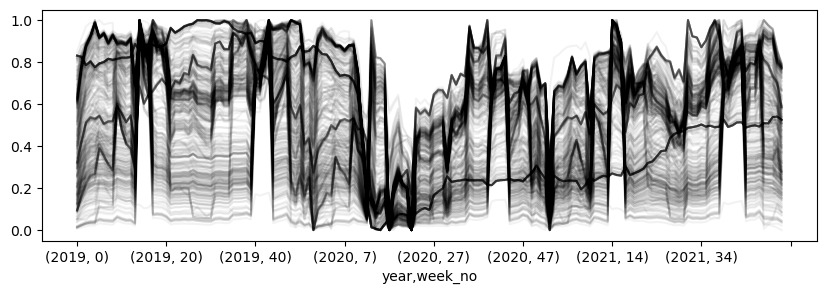

In [6]:
emission_series.plot(figsize=(10,3), color='black', alpha = 0.05, legend=False)

In [7]:
df_cluster = emission_series.copy()
df_cluster = df_cluster.T

cluster_num = 8

df_cluster['ClusterNo'] = kmeans_clustering(df=df_cluster, cluster_num=cluster_num, max_iter = 10000)

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [8]:
df_cluster.head(20)

year                    2019                                          \
week_no                    0         1         2         3         4   
longitude latitude                                                     
28.228    -2.972    0.733708  0.754184  0.744222  0.764801  0.740787   
28.249    -2.451    0.830925  0.824839  0.785891  0.803512  0.775843   
28.297    -1.903    0.813391  0.877999  0.893758  0.926404  0.938527   
28.306    -2.794    0.830925  0.824839  0.785892  0.803512  0.775843   
28.311    -2.589    0.324295  0.426328  0.512901  0.538294  0.531764   
28.353    -2.447    0.830925  0.824839  0.785891  0.803512  0.775843   
28.364    -1.536    0.830925  0.824839  0.785892  0.803512  0.775843   
28.380    -2.820    0.570356  0.731038  0.839829  0.885724  0.937518   
28.398    -1.902    0.804066  0.806220  0.776130  0.794743  0.768099   
28.404    -2.096    0.830925  0.824839  0.785892  0.803512  0.775843   
28.439    -2.761    0.695603  0.725222  0.725422  0.746914  0.724313   
28.454    -2.846    0.830925  0.824839  0.785892  0.803512  0.775843   
28.461    -2.539    0.830925  0.824839  0.785892  0.803512  0.775843   
          -2.339    0.689751  0.817075  0.888466  0.930519  0.982972   
28.467    -1.533    0.830925  0.824839  0.785891  0.803512  0.775843   
28.474    -1.926    0.777786  0.786810  0.764265  0.783617  0.757956   
28.487    -1.613    0.830925  0.824839  0.785892  0.803512  0.775843   
28.510    -1.690    0.830925  0.824839  0.785891  0.803512  0.775843   
28.517    -1.583    0.830925  0.824839  0.785891  0.803512  0.775843   
28.523    -1.877    0.830925  0.824839  0.785891  0.803512  0.775843   

year                                                                  ...  \
week_no                    5         6         7         8         9  ...   
longitude latitude                                                    ...   
28.228    -2.972    0.758512  0.754701  0.770316  0.766023  0.786909  ...   
28.249    -2.451    0.793724  0.800506  0.816375  0.810541  0.815229  ...   
28.297    -1.903    0.916867  0.931525  0.921345  0.933994  0.915715  ...   
28.306    -2.794    0.793724  0.800506  0.816375  0.810541  0.815229  ...   
28.311    -2.589    0.544845  0.507493  0.518642  0.520356  0.589029  ...   
28.353    -2.447    0.793724  0.800506  0.816375  0.810541  0.815229  ...   
28.364    -1.536    0.793725  0.800506  0.816375  0.810542  0.815229  ...   
28.380    -2.820    0.883462  0.885997  0.853613  0.883371  0.873218  ...   
28.398    -1.902    0.786004  0.789518  0.805372  0.799995  0.809741  ...   
28.404    -2.096    0.793724  0.800506  0.816375  0.810542  0.815229  ...   
28.439    -2.761    0.741882  0.734399  0.749836  0.746105  0.772520  ...   
28.454    -2.846    0.793725  0.800506  0.816375  0.810541  0.815229  ...   
28.461    -2.539    0.793724  0.800506  0.816375  0.810541  0.815229  ...   
          -2.339    0.923232  0.943330  0.907215  0.937140  0.897926  ...   
28.467    -1.533    0.793724  0.800506  0.816375  0.810541  0.815229  ...   
28.474    -1.926    0.775796  0.776564  0.792330  0.787359  0.801284  ...   
28.487    -1.613    0.793725  0.800506  0.816375  0.810542  0.815229  ...   
28.510    -1.690    0.793724  0.800506  0.816375  0.810541  0.815229  ...   
28.517    -1.583    0.793724  0.800506  0.816375  0.810541  0.815229  ...   
28.523    -1.877    0.793724  0.800506  0.816375  0.810541  0.815229  ...   

year                    2021                                          \
week_no                   44        45        46        47        48   
longitude latitude                                                     
28.228    -2.972    0.564637  0.579592  0.580585  0.594189  0.594657   
28.249    -2.451    0.488401  0.495071  0.498567  0.492749  0.508997   
28.297    -1.903    0.680634  0.680392  0.683346  0.672006  0.726488   
28.306    -2.794    0.488401  0.495071  0.498567  0.492749  0.508997   
28.311    -2.589    0.758451  0.796847  0.789472  0.863030  0.81209

Cluster No : 0
Cluster No : 65


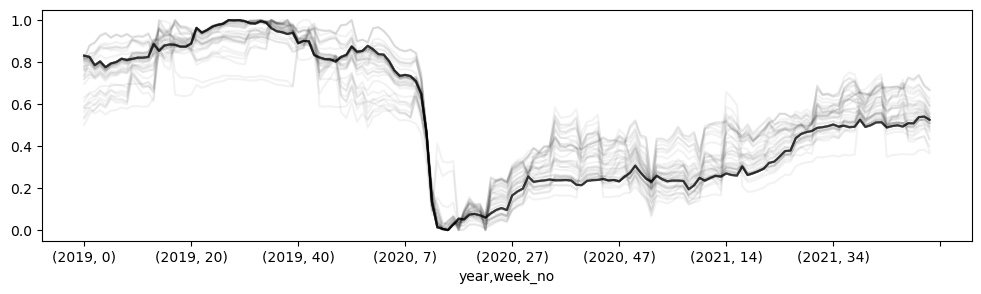

---------------------------------------------------------------------------------------
Cluster No : 1
Cluster No : 51


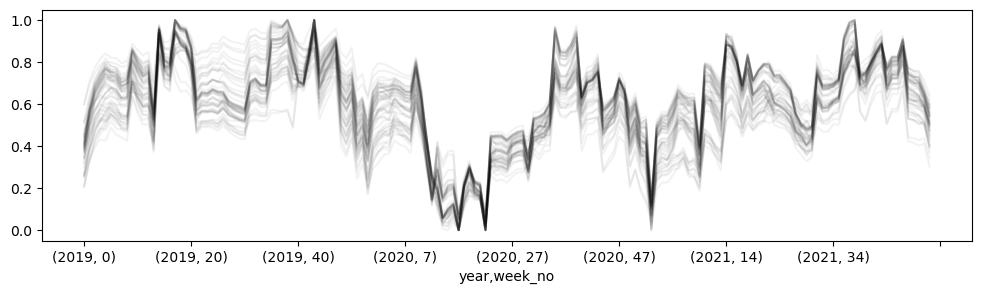

---------------------------------------------------------------------------------------
Cluster No : 2
Cluster No : 95


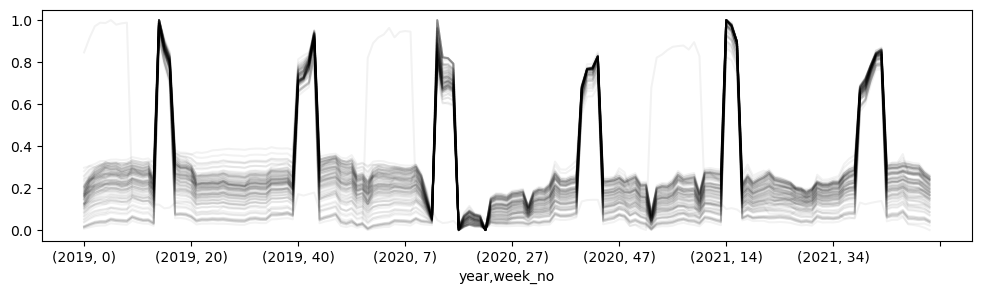

---------------------------------------------------------------------------------------
Cluster No : 3
Cluster No : 44


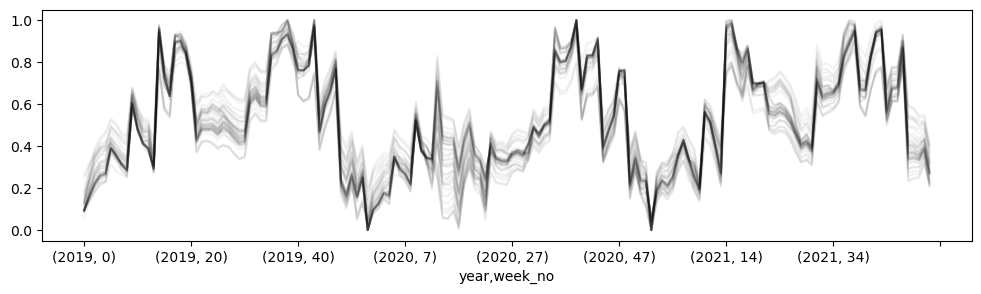

---------------------------------------------------------------------------------------
Cluster No : 4
Cluster No : 118


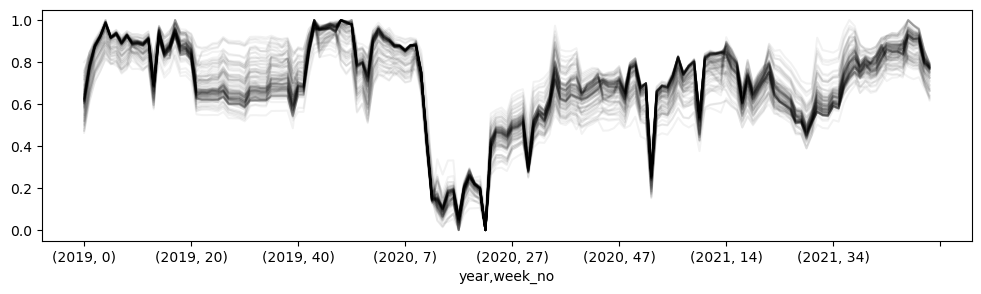

---------------------------------------------------------------------------------------
Cluster No : 5
Cluster No : 61


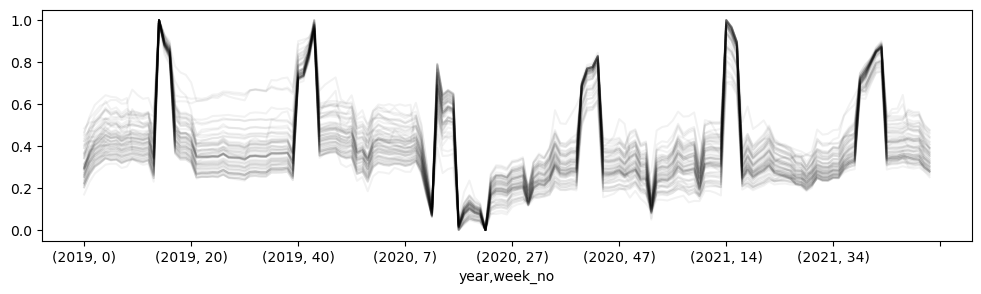

---------------------------------------------------------------------------------------
Cluster No : 6
Cluster No : 38


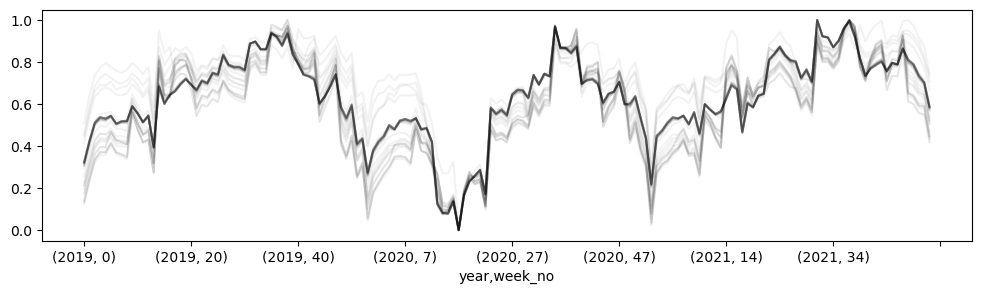

---------------------------------------------------------------------------------------
Cluster No : 7
Cluster No : 10


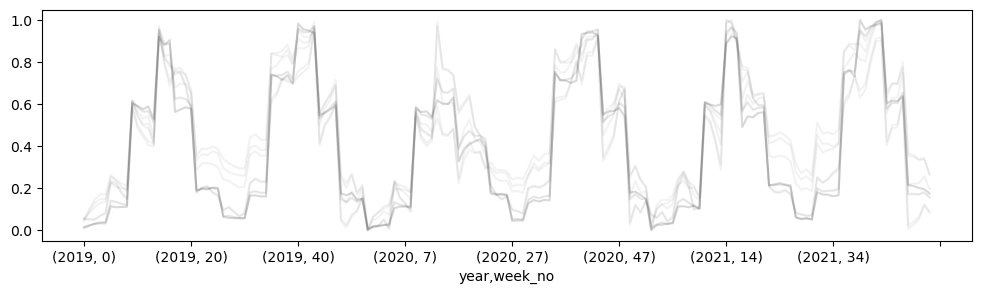

---------------------------------------------------------------------------------------


In [9]:
for ClusterNo in df_cluster['ClusterNo'].sort_values().unique():
    df_plot = df_cluster[df_cluster['ClusterNo'] == ClusterNo].T.drop('ClusterNo')
    print(f'Cluster No : ' + str(ClusterNo))
    print(f'Cluster No : ' + str(len(df_plot.T)))
    df_plot.plot(figsize=(12,3), color='black', legend=False, alpha=0.05)
    plt.show()
    print('---------------------------------------------------------------------------------------')

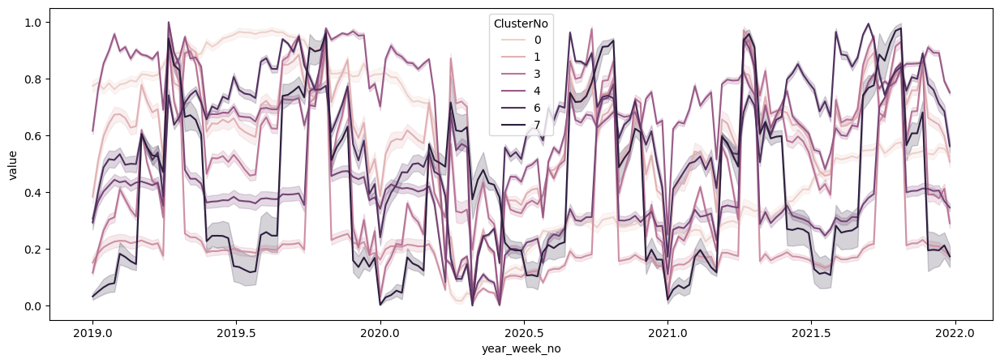

In [10]:
df_plot = df_cluster.melt(id_vars='ClusterNo')
df_plot['year_week_no'] = df_plot['year'] + df_plot['week_no']/53

plt.figure(figsize=(15,5))
ax=sns.lineplot(x='year_week_no', y='value', hue='ClusterNo', data=df_plot)

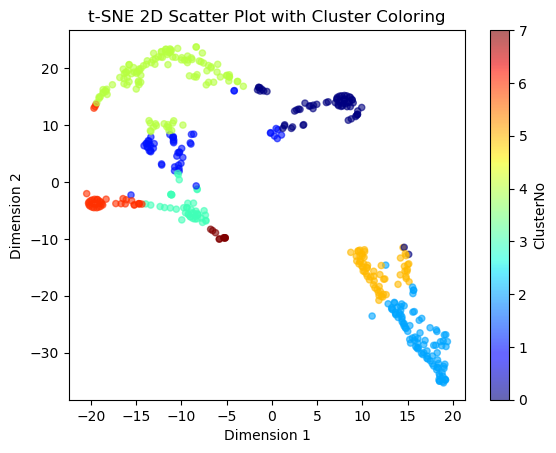

In [11]:
from sklearn.manifold import TSNE

df_plot = df_cluster.drop('ClusterNo',axis=1)
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)
tsne_results = tsne.fit_transform(df_plot)

plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=df_cluster['ClusterNo'], cmap='jet', s=20, alpha=0.6)
plt.colorbar(label='ClusterNo')
plt.title('t-SNE 2D Scatter Plot with Cluster Coloring')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

In [13]:
import plotly.graph_objs as go
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)

In [14]:
for ClusterNo in df_cluster['ClusterNo'].sort_values().unique():
    df_plot = df_cluster[df_cluster['ClusterNo'] == ClusterNo].T.drop('ClusterNo')
    df_plot = df_plot.mean(axis=1).reset_index()
    df_plot = df_plot.pivot_table(index='week_no', columns = 'year', values=0)
    #df_plot.plot(figsize=(12,3), cmap='rainbow')
    df_plot.iplot(title='ClusterNo: '+str(ClusterNo))

**So, how the clustering result might help the prediction task?**

Take ClusterNo.2 as an example, which contains 95 locations (not few!), we can readily observe consistent patterns across these time series. Notably, periods of high emissions seem to consistently occur in May and October. This could potentially indicate seasonal emissions at these locations.

<Axes: xlabel='year,week_no'>

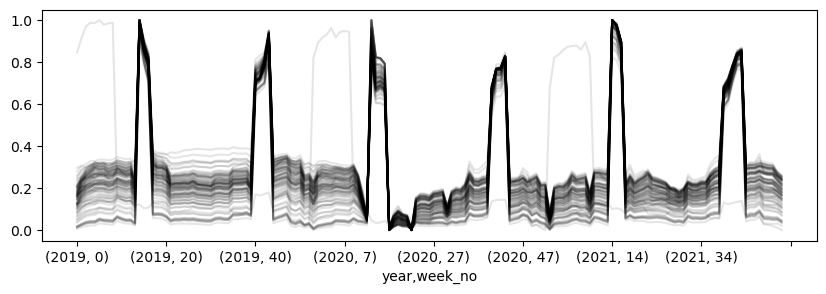

In [15]:
ClusterNo = 2
df_plot = df_cluster[df_cluster['ClusterNo']==ClusterNo].T.drop('ClusterNo')
df_plot.plot(figsize=(10,3),color='black',alpha=0.1,legend=False)

What's more interesting is when we aggregate these emissions by year, we notice slight differences in the lengths of 'week_no' in each year. For instance, the green line, representing the year 2021, shows a longer emission period in October compared to the other two years. This observation suggests that we should take into account the specific start and end periods of emission events each year, as they might influence the accuracy of our models.

<Axes: xlabel='week_no'>

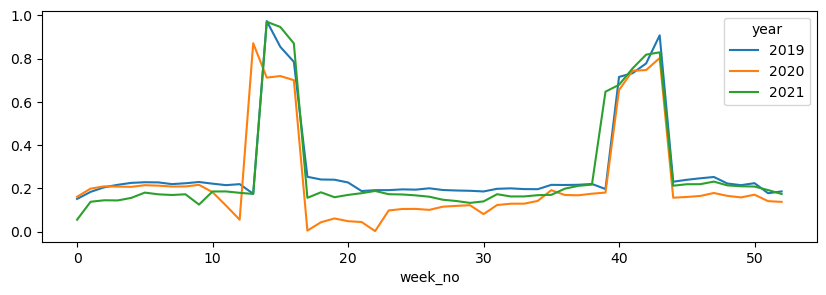

In [16]:
df_plot = df_plot.mean(axis=1).reset_index()
df_plot = df_plot.pivot_table(index='week_no',columns='year',values=0)
df_plot.plot(figsize=(10,3))

In [17]:
train_with_ClusterNo = df.merge(df_cluster['ClusterNo'].reset_index(), on=['longitude', 'latitude'], how='left').fillna(-1)


In [18]:
train_with_ClusterNo.head(20)

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,ClusterNo
0,ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,...,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994,6.0
1,ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,...,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176,6.0
2,ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,...,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381,6.0
3,ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286,6.0
4,ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,...,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317,6.0
5,ID_-0.510_29.290_2019_05,-0.51,29.29,2019,5,0.000294,0.871713,0.000242,0.227656,-13.453690,...,49846.001010,4495.301362,7.556143,0.250228,30.128401,37.007020,-137.388719,21.157820,4.310819,6.0
6,ID_-0.510_29.290_2019_06,-0.51,29.29,2019,6,-0.000285,0.791956,-0.000226,0.119397,72.198647,...,58804.276563,3537.050659,10.493107,0.240828,4.585368,30.491541,-128.196338,21.721202,4.269334,6.0
7,ID_-0.510_29.290_2019_07,-0.51,29.29,2019,7,-0.000016,0.976311,-0.000016,0.106799,-100.956055,...,63697.007267,2597.071563,20.533600,0.250168,16.374829,35.840248,-122.250699,20.432005,4.251361,6.0
8,ID_-0.510_29.290_2019_08,-0.51,29.29,2019,8,-0.000115,0.796941,-0.000101,0.164971,-40.179074,...,67222.556159,2530.851476,24.253928,0.260543,-12.021751,42.688789,-114.296369,22.365602,4.281937,6.0
9,ID_-0.510_29.290_2019_09,-0.51,29.29,2019,9,0.000056,0.998541,0.000014,0.157726,-100.108744,...,60298.717969,3510.293652,13.813379,0.289295,-66.258392,28.596211,-105.687177,21.084021,4.352933,6.0


<a id='Extrapolation_Approach'></a>
## Extrapolation Approach 

**The actio of estimating or concluding something by assuming that existing trend will continue or a current method will remain applicable is knwon as extrapolation approach**


**As the lockdown reduced the emissions for most locations, the maximum emission of the three training years is a good baseline for predicting 2022**

**Code from RANDOM DRAW: https://www.kaggle.com/code/danbraswell/no-ml-public-lb-23-02231**

In [19]:
train = train_with_ClusterNo.copy()

train.insert(3,"lat_lon", list(zip(train["latitude"],train["longitude"])))

locations = train['lat_lon'].unique()

def get_emission_loc_year(loc, year):
    df = train[(train['lat_lon'] == loc) & (train['year'] == year) & (train['week_no'] < 49)].copy()
    return df['emission'].values

def get_max_emission_loc(loc):
    emission_2019 = get_emission_loc_year(loc, 2019)
    emission_2020 = get_emission_loc_year(loc, 2020)
    emission_2021 = get_emission_loc_year(loc, 2021)
    return np.max([emission_2019, emission_2020, emission_2021], axis=0)

emission_predictions = []
# Will return a list of max emission values (between 2019,2020,2021) at each location for week0 to week 49
for loc in locations:
    loc_max_emission =  get_max_emission_loc(loc)
    emission_predictions.append(loc_max_emission)
    
# Stack Horizontally each location emission one after another [1*n +  1*n + ... = 1*(unique locations*n)]
predictions_2022 = np.hstack(emission_predictions)
print(predictions_2022.shape)

predictions_2022


(24353,)


array([ 3.7536006,  4.0519657,  4.231381 , ..., 31.162886 , 31.439606 ,
       29.944366 ])

<a id='Tweaking_Extrapolating'></a>
[INDEX](#INDEX)
## Align 2019-2020 Emission values with 2021
(By: CHUN FU)
Notebook 3

**To reduce the variance compared to the first approach, we can scale the training data to the levels of 2021 (because this year is closest to 2022) or to the levels of 2019 (because this year is unaffected by Covid)**

**Source: https://www.kaggle.com/code/patrick0302/align-2019-2020-emission-values-with-2021**

**As per author - "The primary modification I've made is to adjust the values from 2019 and 2020. This adjustment is based on the presumption that the 2021 values should align more closely with the 2022 predictions. To achieve this, I've employed a straightforward linear transformation to tweak the values of 2019 and 2020, ensuring they align with the mean and standard deviation of the 2021 data."**

In [20]:
#### Same 3 lines from above cell
# train = train_with_ClusterNo.copy()
# train.insert(3,"lat_lon", list(zip(train["latitude"],train["longitude"])))
# locations = train['lat_lon'].unique()

# Calculate the standard deviation of emissions for each year and lat_lon combination
train['location_std'] = train.groupby(['year','lat_lon'])['emission'].transform('std')

# Calculate teh mean of emissions for each year and lat_lon combination
train['location_mean'] = train.groupby(['year', 'lat_lon'])['emission'].transform('mean')

# Normalize/Standardize the emission values using the mean and std computed above
train['emission_norm'] = (train['emission']-train['location_mean'])/train['location_std']

# Create a new column for adjusted emission values, initially set it as the original emission values
train['emission_new'] = train['emission']

# Adjust the 2019 and 2020 'location_std' and 'location_mean' to be the same as 2021's for consistency
train.loc[train['year']==2019, 'location_std'] = train.loc[train['year']==2021, 'location_std'].values
train.loc[train['year']==2020, 'location_std'] = train.loc[train['year']==2021, 'location_std'].values
train.loc[train['year']==2019, 'location_mean'] = train.loc[train['year']==2021,'location_mean'].values
train.loc[train['year']==2020, 'location_mean'] = train.loc[train['year']==2021,'location_mean'].values

# Denormalize the emission_norm values to get the new adjusted emission values
train['emission_new'] = train['emission_norm']*train['location_std']+train['location_mean']

# Replace any NaN values in the 'emission_new' column with 0
train['emission_new'] = train['emission_new'].fillna(0)

**Success! The adjusted values for 2019 and 2020 now align seamlessly with the mean and standard deviation observed in 2021.**

In [21]:
# Compare emission_new with the original ones
train.groupby('year')[['emission','emission_new']].describe().T

year                        2019          2020          2021
emission     count  26341.000000  26341.000000  26341.000000
             mean      87.255317     75.992122     82.574217
             std      148.915277    137.024676    146.469076
             min        0.000000      0.000000      0.000000
             25%       10.765267      8.812202     10.078049
             50%       48.575447     42.038097     46.115383
             75%      116.668620    102.174860    109.531790
             max     3167.768000   3073.070000   2901.339000
emission_new count  26341.000000  26341.000000  26341.000000
             mean      82.574217     82.574217     82.574217
             std      146.469076    146.469076    146.469076
             min        0.000000      0.000000      0.000000
             25%       10.093077      9.982540     10.078049
             50%       46.168080     45.820508     46.115383
             75%      109.531439    110.822738    109.531790
             max     2958.910467   2971.831796   2901.339000

**Here's a visualization of before and after:**

<Axes: xlabel='year,week_no'>

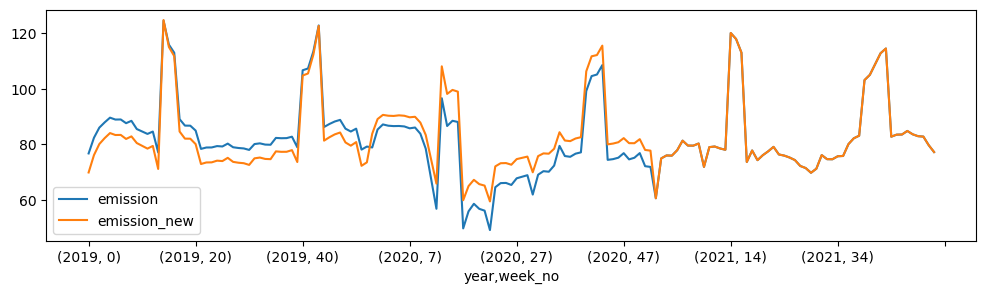

In [22]:
train.pivot_table(index=['year','week_no'], values=['emission','emission_new']).plot(figsize=(12,3))

In [23]:
train['emission'] = train['emission_new']


######  Now the same extrapolation method as above  ########

# Function to get emissions for specified year and location. Only use first 49 weeks.
def get_emissions_loc_year( loc, year ):
    df = train[(train["lat_lon"]==loc) & (train["year"]==year) & (train["week_no"]<49)].copy()
    return df["emission"].values

# Function to get the max emission (over 3 years) at location.
def get_emissions_max( loc ):
    emiss2019 = get_emissions_loc_year(loc,2019)
    emiss2020 = get_emissions_loc_year(loc,2020)
    emiss2021 = get_emissions_loc_year(loc,2021)
    return np.max([emiss2019,emiss2020,emiss2021],axis=0)

# Create 2022 predictions
predictions_acc_new = []
for loc in locations:
    emission = get_emissions_max(loc)
    predictions_acc_new.append( emission )
    
predictions_2022_new = np.hstack(predictions_acc_new)

<a id='NMF_Decomposition'></a>
[INDEX](#INDEX)
## NMF Decomposition of emission matrix w.r.t location and time series

**By: AMBROSM**      
Post 2 : Notebook 4

**Discussion Post: NMF explains how the data was generated
https://www.kaggle.com/competitions/playground-series-s3e20/discussion/430850**

**Source: https://www.kaggle.com/competitions/playground-series-s3e20/discussion/430850**

The target values ('emission') of our dataset are not measuremente, but estimates. This fact explains why the data is low-dimensional and why the data must be decomposed by nonnegative matrix factorization (NMF).

Imagine that you want to estimate CO2 emissions for thousands of locations (the competition data shows only a subset). To get thousands of estimates efficiently, you cannot look at every location in detail, but you can simplify your work by dividing the problem into two sub-problems:

1. Estimate the emission patterns for different sectors of the economy, e.g. residential buildings, commercial buildings, ground traffic, air traffic, … Every sector has a characteristic pattern:
* Residential buildings emit the most CO2 during cold seasons (because of heating) or during hot seasons (because of cooling). Their emissions don't change much during the lockdown.
* Commercial buildings emit more CO2 during the week than on week-ends.
* Ground traffic doesn't depend on the season, but is reduced during lockdowns.
* Air traffic might have seasonal peaks during vacation periods and is reduced during lockdowns.
2. For every location, estimate the contribution of the sectors (components) defined above:
* A rural location has residential buildings, but few commercial buildings.
* A city has a higher contribution from commercial buildings.
* A freeway through a forest has ground traffic emissions, but no buildings.
* The emissions of an airport location follow the seasonal peaks of air traffic and depend on the size of the airport.


The result of this process can be described by two matrices. The first matrix (let's call it B) shows the emission pattern (time  series) of every sector in its rows:   <img>

The second matrix (let's call it A) shows the contributions of the components to every location:  <img>

A simple matrix multiplication (X = A @ B) then gives estimates for all locations and times:  <img>

---

In this competition, we got only X, but not A and B. Can we recover A and B from X? Yes, this is possible. Note that all elements of A, B and X are nonnegative (emissions are never negative, nor are the contributions of the sectors). This nonnegativity enables us to recover the matrices A and B by nonnegative matrix factorization (NMF).

In [24]:
from sklearn.decomposition import NMF

In [33]:
X = train.pivot(index=['latitude', 'longitude'], columns=['year', 'week_no'], values='emission')
print(X.shape)
X.head(10)

(497, 159)


year                      2019                                      \
week_no                     0           1           2           3    
latitude longitude                                                   
-3.299   30.301      23.642780   26.061738   27.621450   28.443016   
-3.287   29.713      38.118992   41.964321   44.436122   45.609726   
-3.174   29.926      38.613677   41.782196   44.005627   45.085153   
-3.161   28.839       0.107097    0.113873    0.119626    0.121330   
-3.153   30.347      12.172375   13.713914   14.510821   15.074828   
-3.138   30.662      18.116393   20.101511   21.229605   22.033665   
-3.136   30.364      13.437901   14.022968   14.431713   14.691327   
-3.133   29.467     103.001301  110.909894  116.725965  119.336132   
-3.099   29.601      68.169924   73.128642   76.811164   78.472242   
-3.095   29.505       3.197993    3.263126    3.128599    3.266877   

year                                                                \
week_no                     4           5           6           7    
latitude longitude                                                   
-3.299   30.301      29.220774   28.559335   28.585372   27.929776   
-3.287   29.713      47.194146   45.573221   45.923624   44.784425   
-3.174   29.926      45.842835   45.265081   44.958116   44.216843   
-3.161   28.839       0.120909    0.121922    0.119431    0.120127   
-3.153   30.347      15.625329   15.008440   15.231864   14.826184   
-3.138   30.662      22.302265   22.270584   22.133309   21.825108   
-3.136   30.364      14.613879   14.850821   14.622810   14.589356   
-3.133   29.467     121.305255  120.034852  119.099073  117.140508   
-3.099   29.601      79.659031   79.050221   78.379803   77.131395   
-3.095   29.505       3.112754    3.246201    3.242377    3.310343   

year                                        ...        2021              \
week_no                     8           9   ...          43          44   
latitude longitude                          ...                           
-3.299   30.301      28.249288   29.521989  ...   30.141666   29.346270   
-3.287   29.713      45.566078   45.543389  ...   45.896976   46.181232   
-3.174   29.926      44.425271   47.669924  ...   48.809760   46.763184   
-3.161   28.839       0.120214    0.125019  ...    0.136329    0.133347   
-3.153   30.347      15.146533   14.933463  ...   15.564887   15.680665   
-3.138   30.662      21.947060   23.368838  ...   26.129744   25.244322   
-3.136   30.364      14.495673   15.936747  ...   17.626005   16.419931   
-3.133   29.467     117.578092  126.531145  ...  129.019640  122.964210   
-3.099   29.601      77.329685   83.560338  ...   85.458810   81.019005   
-3.095   29.505       3.259212    3.584615  ...    4.551902    4.282723   

year                                                                \
week_no                     45          46          47          48   
latitude longitude                                                   
-3.299   30.301      29.688602   29.701365   30.297634   29.404171   
-3.287   29.713      46.249504   46.270954   46.455006   47.328110   
-3.174   29.926      47.626120   47.619976   49.147602   46.265680   
-3.161   28.839       0.135766    0.135322    0.139941    0.136397   
-3.153   30.347      15.678098   15.700193   15.649941   16.179245   
-3.138   30.662      25.642344   25.646809   26.277980   25.387463   
-3.136   30.364      16.882093   16.873674   17.652615   15.999958   
-3.133   29.467     125.441600  125.408520  129.880460  121.018890   
-3.099   29.601      82.769790   82.750990   85.898740   79.402374   
-3.095   29.505       4.369792    4.382591    4.467985    4.271950   

year                                                                
week_no                     49          50          51          52  
latitude longitude                                                  
-3.299   30.301      29.186497   29.131205   28.125792   27.239302  
-3.287   29.713

In [46]:
#### Split above X matrix into two matrix

# NUmber of components to splits into  [X(r*c) matrix --> W(r*n) & H(n*c)] [X(497*159)  --> W(497*6) and H(6*159)]
n_components = 6
nmf = NMF(n_components=n_components, solver='cd', tol=1e-8, max_iter=50000, random_state=101)
nmf.fit(X)
 
#### Display Components for understanding purpose
print(nmf.transform(X).shape)   #ndarray of shape (n_data_instance, n_components)  (497,6)
print(nmf.components_.shape)   #ndarray of shape (n_components, n_features)        (6,159)
nmf.components_

(497, 6)
(6, 159)


array([[9.42427282e+00, 9.24744800e+00, 9.67570319e+00, 9.63546010e+00,
        9.87013126e+00, 1.24112413e+01, 1.19491953e+01, 1.12786897e+01,
        1.07570993e+01, 1.37106303e+01, 1.20632076e+01, 1.14003005e+01,
        1.07072410e+01, 1.04531969e+01, 1.37742376e+02, 1.19760462e+02,
        1.05907456e+02, 1.62503550e+01, 1.65389146e+01, 1.55046922e+01,
        1.35488552e+01, 1.00580232e+01, 1.07217664e+01, 1.06402759e+01,
        1.00907171e+01, 9.71275465e+00, 9.92801113e+00, 9.89437032e+00,
        9.54255304e+00, 9.17801864e+00, 9.47862163e+00, 1.10422107e+01,
        1.14187319e+01, 1.09927568e+01, 1.10632529e+01, 1.38300091e+01,
        1.44315405e+01, 1.56091872e+01, 1.55988659e+01, 1.55602557e+01,
        9.91374153e+01, 1.02619274e+02, 1.04989820e+02, 1.25688574e+02,
        1.07495865e+01, 1.23857358e+01, 1.30090395e+01, 1.43018436e+01,
        6.29432867e+00, 5.59620964e+00, 6.10970235e+00, 7.09397596e+00,
        8.14560243e+00, 3.19783723e+00, 6.92069480e+00, 8.065433

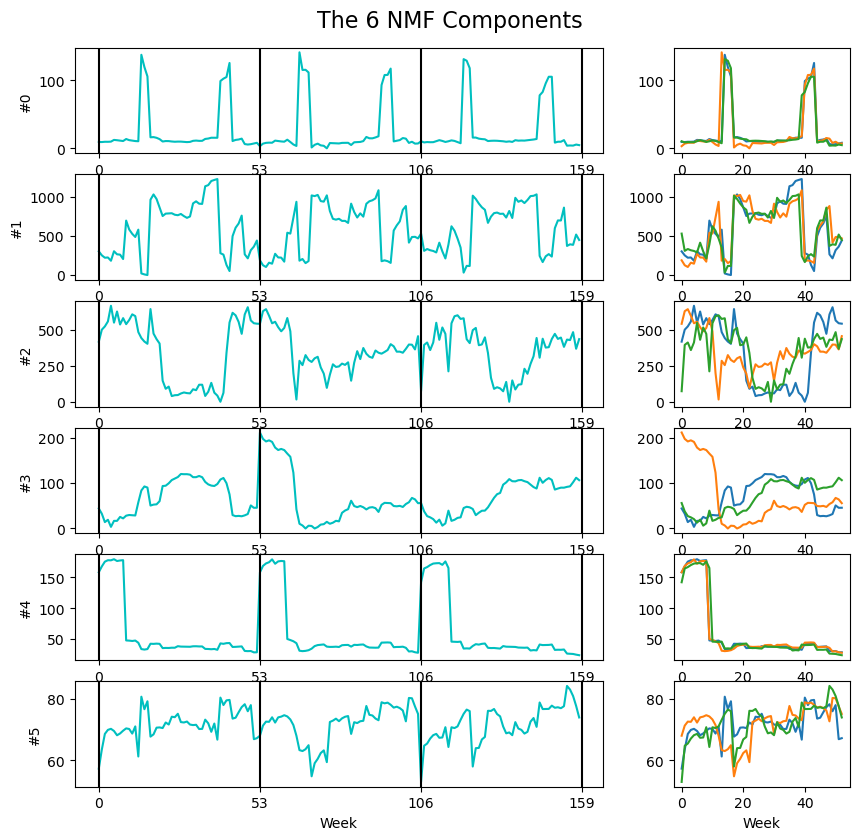

In [27]:
### Plot of above axis

_,axes = plt.subplots(n_components, 2, width_ratios=[3,1], figsize=(10,n_components*1.6))

for i,ax in enumerate(axes):
    ax[0].plot(nmf.components_[i], color='c')
    for x in [0,53,106,159]: ax[0].axvline(x, color='k')
    ax[0].set_xticks([0,53,106,159])
    ax[0].set_ylabel(f"#{i}")
    
    ax[1].plot(nmf.components_[i].reshape(3,53).T)
    
axes[n_components-1, 0].set_xlabel('Week')
axes[n_components-1, 1].set_xlabel('Week')
plt.suptitle('The 6 NMF Components', fontsize=16, y=0.92)
plt.savefig('nmf.png')
plt.show()

The six rows of B can be shown as time series in a diagram. Notice
* Every row has another seasonal pattern.
* Components #2 and #3 are periodic — they are not affected by Covid.
* Component #1 has an inverse Covid effect: The emissions go up in 2020

The information about the estimation process has been taken from https://carbonmonitor-graced.com/methods.html#background (which is acknowledged on the competition homepage), and the source code for the diagram is here:

---
---

<a id='Comment_on_NMF_Decomposition'></a>
[INDEX](#INDEX)
## Important Comment on NMF Decomposition

**By: Broccoli Beef**      
Post 2: Notebook 4


**Source : https://www.kaggle.com/competitions/playground-series-s3e20/discussion/430850**


**Question by MXMLNV:  I wonder if this decomposition applies to features other than emission, and if so, is the weight matrix (matrix A) the same for all features?**

Answer by Broccoli Beef : A low rank NMF implies that the data reside in a low-dimensional linear submanifold. This is uncommon and suggests a low number of (linear) latent factors. Of course to compute the NMF you would also need the data to be non-negative to begin with, although there are generalizations of NMF that would remove this restriction. You can estimate the linear dimension of a feature using SVD. There are no features other than emission with linear dimension considerably less than 159 (full dimension of the data). The UvAerosolLayerHeight features appear to be in a low-dimensional subspace because the time series are much shorter due to missing values.

In [40]:
train.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,lat_lon,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,...,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,ClusterNo,location_std,location_mean,emission_norm,emission_new
0,ID_-0.510_29.290_2019_00,-0.51,29.29,"(-0.51, 29.29)",2019,0,-0.000108,0.603019,-0.000065,0.255668,...,-12.628986,35.632416,-138.786423,30.752140,3.468878,6.0,0.281012,4.404019,-3.327764,3.468878
1,ID_-0.510_29.290_2019_01,-0.51,29.29,"(-0.51, 29.29)",2019,1,0.000021,0.728214,0.000014,0.130988,...,30.359375,39.557633,-145.183930,27.251779,3.863742,6.0,0.281012,4.404019,-1.922612,3.863742
2,ID_-0.510_29.290_2019_02,-0.51,29.29,"(-0.51, 29.29)",2019,2,0.000514,0.748199,0.000385,0.110018,...,15.377883,30.401823,-142.519545,26.193296,4.160708,6.0,0.281012,4.404019,-0.865839,4.160708
3,ID_-0.510_29.290_2019_03,-0.51,29.29,"(-0.51, 29.29)",2019,3,-1.000000,-1.000000,-1.000000,-1.000000,...,-11.293399,24.380357,-132.665828,28.829155,4.267142,6.0,0.281012,4.404019,-0.487087,4.267142
4,ID_-0.510_29.290_2019_04,-0.51,29.29,"(-0.51, 29.29)",2019,4,-0.000079,0.676296,-0.000048,0.121164,...,38.532263,37.392979,-141.509805,22.204612,4.327673,6.0,0.281012,4.404019,-0.271681,4.327673


In [44]:
from sklearn.impute import SimpleImputer
from sklearn.decomposition import TruncatedSVD
from tqdm import tqdm

def dim(col): 
    X = pd.pivot_table(train, index=['latitude','longitude'], columns=['year','week_no'], values=col).to_numpy()
    X = SimpleImputer().fit_transform(X.T).T
    svd = TruncatedSVD(n_components=X.shape[1]).fit(X)
    return np.argmax(np.isclose(np.cumsum(svd.explained_variance_ratio_), 1))+1

cols = train.columns[6:]
d = {}
for col in tqdm(cols):
    d[col] = dim(col)
    
pd.Series({col:d[col] for col in d if d[col]<159}).sort_values()

100%|██████████| 76/76 [00:10<00:00,  6.92it/s]


location_mean                                             1
location_std                                              1
ClusterNo                                                 1
UvAerosolIndex_sensor_altitude                            2
emission_new                                              9
emission                                                  9
UvAerosolLayerHeight_aerosol_height                      24
UvAerosolLayerHeight_aerosol_pressure                    24
UvAerosolLayerHeight_sensor_zenith_angle                 25
UvAerosolLayerHeight_sensor_azimuth_angle                25
UvAerosolLayerHeight_solar_azimuth_angle                 25
UvAerosolLayerHeight_aerosol_optical_depth               25
UvAerosolLayerHeight_solar_zenith_angle                  25
emission_norm                                            26
Ozone_O3_column_number_density                           46
CarbonMonoxide_sensor_altitude                          119
CarbonMonoxide_CO_column_number_density 

***

***

## PGS320: CO2 Emissions Animated Map

By: KONSTANTIN DMITRIEV
Source: https://www.kaggle.com/code/kdmitrie/pgs320-co2-emissions-animated-map
Post Source: https://www.kaggle.com/competitions/playground-series-s3e20/discussion/429207

**CO2 emissions animated**   
I have prepared an animation of CO2 emissions based on the raw competition data.
Each column of the image grid below corresponds to a year. In the top row, the emission feature is depicted, and in the bottom row, it is divided by the maximum emission value in the corresponding coordinates.



Looking at this animation, you can see the appearance of patterns, i.e., the emissions can rise in some areas simultaneously. Also, you can see that there is some dissynchronization between the years, which can be caused by the fact that we are dealing with weekly and not daily data.

It is possible to make an animation of other provided features. The script I used is available by the link https://www.kaggle.com/code/kdmitrie/pgs320-co2-emissions-animated-map.

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import PillowWriter
from IPython.display import Image



train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
print(train.shape)
print(test.shape)
train.head()

(79023, 76)
(24353, 75)


,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_1080\3871772744.py:23: RuntimeWarning: invalid value encountered in divide
  p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)


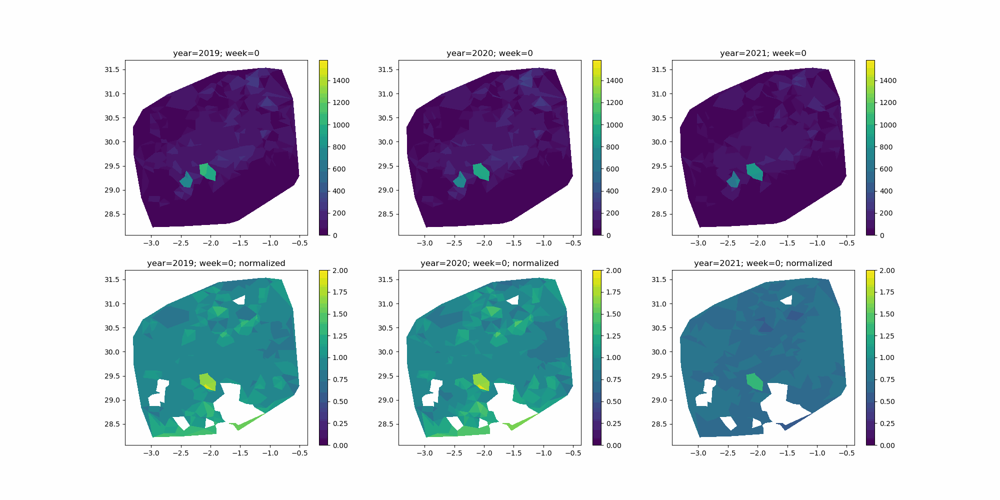

In [6]:
df = train.copy()

writer = PillowWriter(fps=2)

fig, ax = plt.subplots(ncols=3, nrows=2)
fig.set_size_inches(20, 10)

mean_values = df.groupby(by=['latitude', 'longitude']).emission.median()
vmax = df.emission.max()

with writer.saving(fig, "emissions.gif", 100):
    for week_no in range(53):
        cb = [0] * 6
        for n, year in enumerate([2019, 2020, 2021]):
            data = df[(df.year == year) & (df.week_no == week_no)][['latitude', 'longitude', 'emission']].to_numpy()
            data_mean = [mean_values[tuple(data[n, 0:2])] for n in range(data.shape[0])]
            
            p = ax[0, n].tripcolor(data[:, 0], data[:, 1], data[:, 2], vmin=0, vmax=vmax/2)
            ax[0, n].set_title(f'{year=}; week={week_no}')
            cb[n] = fig.colorbar(p, ax=ax[0, n])
        
            with np.errstate(divide='ignore'):
                p = ax[1, n].tripcolor(data[:, 0], data[:, 1], np.divide(data[:, 2], data_mean), vmin=0, vmax=2)
                
            ax[1, n].set_title(f'{year=}; week={week_no}; normalized')
            cb[3 + n] = fig.colorbar(p, ax=ax[1, n])
        
        writer.grab_frame()
        for n in range(6):
            cb[n].remove()
plt.close()
display(Image(data=open('emissions.gif','rb').read(), format='gif'))

***

***

***

***

<a id='Complete_EDA'></a>
[INDEX](#INDEX)

#  PSS3E20 EDA which makes sense ⭐️⭐️⭐️⭐️⭐️

**By: AMBROSM**       
Notebook 4

**Source : https://www.kaggle.com/code/ambrosm/pss3e20-eda-which-makes-sense**

Before starting the EDA, have a look at the home page of the [Sentinel-5P satellite](https://developers.google.com/earth-engine/datasets/catalog/sentinel-5p?hl=en), which has produced the dataset. The satellite measures the concentration of several gases in the air, and its data can be visualized in images such as this one, which shows the world-wide carbon monoxide concentration:

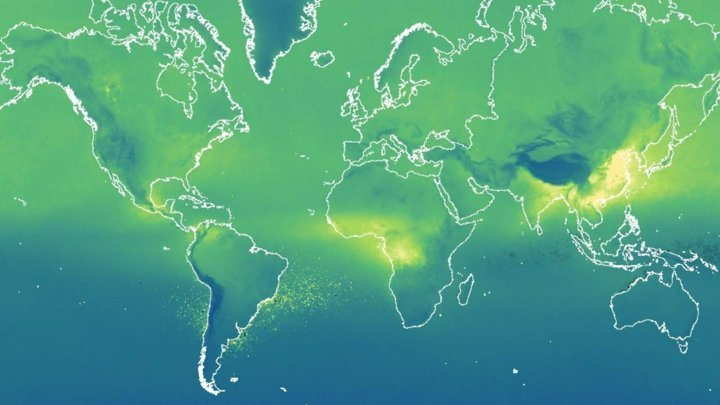

In [47]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

############################################

# These options determine the way floating point numbers, arrays and other NumPy objects are displayed.
# np.set_printoptions(linewidth=95, edgeitems=5)  

## Reading the Data

In [50]:
raw_train = pd.read_csv('train.csv', index_col='ID_LAT_LON_YEAR_WEEK')
raw_test = pd.read_csv('test.csv', index_col='ID_LAT_LON_YEAR_WEEK')
train = raw_train.copy()
test = raw_test.copy()
print(train.shape)
print(test.shape)
train.head()

(79023, 75)
(24353, 74)


,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
ID_LAT_LON_YEAR_WEEK,,,,,,,,,,,,,,,,,,,,,
ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,52.868816,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,35.515587,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


Every row of train contains four index columns (`latitude`, `longitude`, `year` and `week_no`), 70 features and a target (`emission`). The 70 features come in 8 groups of various sizes.

7 of the groups correspond to the main features (measurements) of the [data description page](https://www.kaggle.com/competitions/playground-series-s3e20/data):
<ul>
<li>Sulphur Dioxide - <a rel="noreferrer nofollow" target="_blank" href="https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_SO2?hl=en">COPERNICUS/S5P/NRTI/L3_SO2</a></li>
<li>Carbon Monoxide - <a rel="noreferrer nofollow" target="_blank" href="https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_CO?hl=en">COPERNICUS/S5P/NRTI/L3_CO</a></li>
<li>Nitrogen Dioxide - <a rel="noreferrer nofollow" target="_blank" href="https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_NO2?hl=en">COPERNICUS/S5P/NRTI/L3_NO2</a></li>
<li>Formaldehyde - <a rel="noreferrer nofollow" target="_blank" href="https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_HCHO?hl=en">COPERNICUS/S5P/NRTI/L3_HCHO</a></li>
<li>UV Aerosol Index - <a rel="noreferrer nofollow" target="_blank" href="https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_AER_AI?hl=en">COPERNICUS/S5P/NRTI/L3_AER_AI</a></li>
<li>Ozone - <a rel="noreferrer nofollow" target="_blank" href="https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_O3?hl=en">COPERNICUS/S5P/NRTI/L3_O3</a></li>
<li>Cloud - <a rel="noreferrer nofollow" target="_blank" href="https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_OFFL_L3_CLOUD?hl=en">COPERNICUS/S5P/OFFL/L3_CLOUD</a></li>
</ul>

Click on some of the links above - you'll learn something about how the data was measured and preprocessed and about missing values. All the seven description pages contain a `Bands` tab, which describes the subfeatures.

The eighth group has names starting with `UvAerosolLayerHeight`.

The following table has been taken from the [SO2 data description](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S5P_NRTI_L3_SO2?hl=en#bands) and explains the SO2 subfeatures (the other features are similar):
<table class="eecat">
<tbody><tr>
<th scope="col">Name</th>
<th scope="col">Units</th>
<th scope="col">Min</th>
<th scope="col">Max</th>
<th scope="col">Description</th>
</tr>
<tr>
<td><code translate="no" dir="ltr">SO2_<wbr>column_<wbr>number_<wbr>density</code></td>
<td>mol/m^2</td>
<td>
          -48*
</td>
<td>
          0.24*
</td>
<td><p>SO<sub>2</sub> vertical column density at ground level,
calculated using the DOAS technique.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">SO2_<wbr>column_<wbr>number_<wbr>density_<wbr>amf</code></td>
<td>mol/m^2</td>
<td>
          0.1*
</td>
<td>
          3.397*
</td>
<td><p>Weighted mean of cloudy and clear air mass factor (amf) weighted by
intensity-weighted cloud fraction.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">SO2_<wbr>slant_<wbr>column_<wbr>number_<wbr>density</code></td>
<td>mol/m^2</td>
<td>
          -0.147*
</td>
<td>
          0.162*
</td>
<td><p>SO<sub>2</sub> ring corrected slant column number density</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">cloud_<wbr>fraction</code></td>
<td>Fraction</td>
<td>
          0*
</td>
<td>
          1*
</td>
<td><p>Effective cloud fraction.  See the <a href="https://sentinels.copernicus.eu/documents/247904/3119978/Sentinel-5P-Level-2-Input-Output-Data-Definition">Sentinel 5P L2 Input/Output Data Definition Spec</a>,
p.220.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sensor_<wbr>azimuth_<wbr>angle</code></td>
<td>deg</td>
<td>
          -180*
</td>
<td>
          180*
</td>
<td><p>Azimuth angle of the satellite at the ground pixel location (WGS84); angle
measured East-of-North.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sensor_<wbr>zenith_<wbr>angle</code></td>
<td>deg</td>
<td>
          0.09*
</td>
<td>
          67*
</td>
<td><p>Zenith angle of the satellite at the ground pixel location (WGS84); angle
measured away from the vertical.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">solar_<wbr>azimuth_<wbr>angle</code></td>
<td>deg</td>
<td>
          -180*
</td>
<td>
          180*
</td>
<td><p>Azimuth angle of the Sun at the ground pixel location (WGS84); angle
measured East-of-North.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">solar_<wbr>zenith_<wbr>angle</code></td>
<td>deg</td>
<td>
          8*
</td>
<td>
          80*
</td>
<td><p>Zenith angle of the satellite at the ground pixel location (WGS84); angle
measured away from the vertical.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">SO2_<wbr>column_<wbr>number_<wbr>density_<wbr>15km</code></td>
<td>mol/m^2</td>
<td>
</td>
<td>
</td>
<td><p>SO<sub>2</sub> vertical column density at 15km,
calculated using the DOAS technique.</p></td>
</tr>
</tbody></table>

The groups contain different subfeatures, but four subfeatures appear in every group:
- 'sensor_azimuth_angle',
- 'sensor_zenith_angle',
- 'solar_azimuth_angle',
- 'solar_zenith_angle',

The subfeatures are necessary to interpret the measurements. As the data was measured by a satellite which is not directly above the measured location, the angle of the satellite affects the measurement. The measurements are further influenced by the angle of the sun and by clouds.

The following list shows the names of all 75 training columns:

https://www.kaggle.com/code/ambrosm/pss3e20-eda-which-makes-sense?cellIds=5&kernelSessionId=140324483

In [51]:
for i, f in enumerate(train.columns):
    print(f"{i:2}: {f}")

 0: latitude
 1: longitude
 2: year
 3: week_no
 4: SulphurDioxide_SO2_column_number_density
 5: SulphurDioxide_SO2_column_number_density_amf
 6: SulphurDioxide_SO2_slant_column_number_density
 7: SulphurDioxide_cloud_fraction
 8: SulphurDioxide_sensor_azimuth_angle
 9: SulphurDioxide_sensor_zenith_angle
10: SulphurDioxide_solar_azimuth_angle
11: SulphurDioxide_solar_zenith_angle
12: SulphurDioxide_SO2_column_number_density_15km
13: CarbonMonoxide_CO_column_number_density
14: CarbonMonoxide_H2O_column_number_density
15: CarbonMonoxide_cloud_height
16: CarbonMonoxide_sensor_altitude
17: CarbonMonoxide_sensor_azimuth_angle
18: CarbonMonoxide_sensor_zenith_angle
19: CarbonMonoxide_solar_azimuth_angle
20: CarbonMonoxide_solar_zenith_angle
21: NitrogenDioxide_NO2_column_number_density
22: NitrogenDioxide_tropospheric_NO2_column_number_density
23: NitrogenDioxide_stratospheric_NO2_column_number_density
24: NitrogenDioxide_NO2_slant_column_number_density
25: NitrogenDioxide_tropopause_pressur

**Insight:**
1. The satellite measures the concentration of several gases in the atmosphere, but it does not measure CO2. Our task is to predict the CO2 emission for every location and point in time based on the concentration of the other gases.
2. We do not know how the CO2 emissions were measured. They are not measured by the Sentinel-5P satellite. They could be measured by stations on the ground or by some other satellite.


# Completeness of the data

We see that
- There are 497 geographical points (latitude-longitude pairs). The points are the same in train and test.
- For every geographical point, there are 159 rows with observations in train and 49 rows in test.
- The 159 training rows correspond to three years (2019, 2020, 2021) with 53 weeks each (numbered from 0 to 52).
- The 49 test rows correspond to weeks 0 to 48 of 2022.
- 497 \* 3 \* 53 = 79023, the size of the training dataset.
- 497 * 49 = 24353, the size of the test set.

In [52]:
print(train.groupby(['latitude', 'longitude']).size().sort_values())
print()
print(train.groupby(['latitude', 'longitude']).size().sort_values())
print()

latitude  longitude
-3.299    30.301       159
-1.444    30.856       159
-1.450    29.350       159
-1.482    30.618       159
-1.486    29.614       159
                      ... 
-2.293    29.507       159
-2.300    29.200       159
-2.301    29.899       159
-2.257    30.243       159
-0.510    29.290       159
Length: 497, dtype: int64

latitude  longitude
-3.299    30.301       159
-1.444    30.856       159
-1.450    29.350       159
-1.482    30.618       159
-1.486    29.614       159
                      ... 
-2.293    29.507       159
-2.300    29.200       159
-2.301    29.899       159
-2.257    30.243       159
-0.510    29.290       159
Length: 497, dtype: int64



Text(0, 0.5, 'latitude')

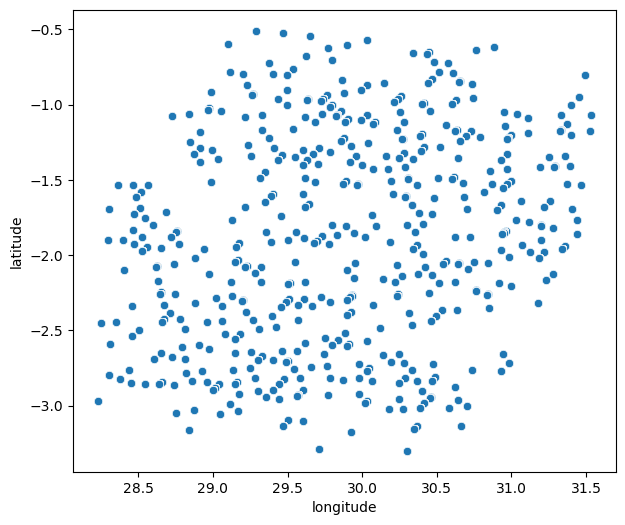

In [55]:
plt.figure(figsize=(7,6))
sns.scatterplot(x='longitude', y='latitude', data=train)
plt.title("The 497 points on the earth's surface")
plt.xlabel('longitude')
plt.ylabel('latitude')
# plt.gca().set_aspect('equal')    #From the original, don't know what it does
plt.show()

### The plot looks much nicer if we plot the points on a map: 

**Remeber for future purpose**


In [63]:
# pip install folium
# pip install geopandas

In [61]:
import folium
import geopandas as gpd

In [62]:
train_coords = train.drop_duplicates(subset = ['latitude', 'longitude'])

geometry = gpd.points_from_xy(train_coords.longitude, train_coords.latitude)
geo_df = gpd.GeoDataFrame(train_coords[['latitude', 'longitude']], geometry = geometry)

# Create a canvas to plot your map on
all_data_map = folium.Map(prefer_canvas=True)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry]

#Iterate through list and add a marker for each location
for coordinates in geo_df_list:
    # Place the marker
    all_data_map.add_child(
        folium.CircleMarker(location=coordinates, radius=1, weight=4, zoom=10, color='blue'),
    )

all_data_map.fit_bounds(all_data_map.get_bounds())
all_data_map

**Insight:**
- As we are working with **geographical data**, measurements of nearby locations can help to predict the target.
- A good machine learning model will not simply take the 74 features of every row to predict the target, but use the features of nearby locations to improve the predictions.
- The data is a **time series**. Measurements of earlier points in time may help to predict the current point.
---

---
# Missing values
- Except for the index columns (`latitude`, `longitude`, `year` and `week_no`) and the target (`emission`), every column has missing values.
- Some colunms (e.g., `UvAerosolLayerHeight_aerosol_pressure`) have almost only missing values (78584 of 79023):

**Values are missing if during a whole week the satellite never could make a reliable measurement for a location, for instance because of clouds or because it never saw the location from a good angle.**

In [64]:
with pd.option_context("display.min_rows", 14):
    display(train.isna().sum().sort_values())
print()
with pd.option_context("display.min_rows", 14):
    display(test.isna().sum().sort_values())

latitude                                          0
week_no                                           0
emission                                          0
longitude                                         0
year                                              0
Cloud_solar_zenith_angle                        484
Cloud_cloud_top_pressure                        484
                                              ...  
UvAerosolLayerHeight_sensor_zenith_angle      78584
UvAerosolLayerHeight_solar_azimuth_angle      78584
UvAerosolLayerHeight_sensor_azimuth_angle     78584
UvAerosolLayerHeight_aerosol_optical_depth    78584
UvAerosolLayerHeight_aerosol_height           78584
UvAerosolLayerHeight_solar_zenith_angle       78584
UvAerosolLayerHeight_aerosol_pressure         78584
Length: 75, dtype: int64

latitude                                          0
longitude                                         0
year                                              0
week_no                                           0
UvAerosolIndex_sensor_altitude                  147
UvAerosolIndex_sensor_azimuth_angle             147
UvAerosolIndex_sensor_zenith_angle              147
                                              ...  
UvAerosolLayerHeight_solar_azimuth_angle      22260
UvAerosolLayerHeight_sensor_azimuth_angle     22260
UvAerosolLayerHeight_sensor_zenith_angle      22260
UvAerosolLayerHeight_aerosol_optical_depth    22260
UvAerosolLayerHeight_aerosol_pressure         22260
UvAerosolLayerHeight_solar_zenith_angle       22260
UvAerosolLayerHeight_aerosol_height           22260
Length: 74, dtype: int64

**Insight:**
- We need a way to handle missing data. As data is missing in train and test, we cannot simply drop rows with missing data, but need to impute the missing values.
- As we are working with geographical data, measurements of nearby locations can be used for imputing missing values.
- As the data is a time series, measurements of nearby points in time can be used for imputing missing values.


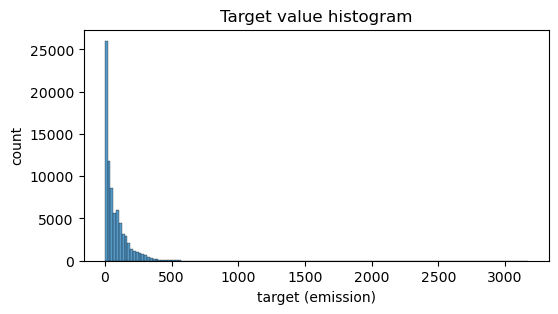

In [76]:
plt.figure(figsize=(6,3))
sns.histplot(x='emission', data=train, bins=150)
plt.title('Target value histogram')
plt.xlabel('target (emission)')
plt.ylabel('count')
plt.show()

There are public notebooks in this competition which suggest to treat the skewed target distribution with techniques such as log transform, box-cox transform or square root transform. I strongly advise against these transformations! 

**Insight:** The target must not be transformed: The competition is scored on root mean squared error (RMSE), and the usual target transformations make it very hard to optimize RMSE.

Next, we'll look at the mean target value per location. We see:
- Several locations have a mean emission of zero, and because there are no negative emissions, their emission is constantly at zero. These locations will be easy to predict 🙂
- Even the distribution of the mean emission per location looks like an exponential distribution.

In [71]:
train.groupby(['latitude','longitude'])['emission'].mean().sort_values()

latitude  longitude
-1.682    29.218          0.000000
-2.859    29.041          0.000000
-1.833    28.467          0.000000
-2.841    29.159          0.000000
-1.974    28.526          0.000000
                          ...     
-1.342    31.358        409.606870
-0.956    30.744        455.398039
-1.346    31.254        475.289138
-2.079    29.321       1221.886518
-2.378    29.222       2233.431628
Name: emission, Length: 497, dtype: float64

<Axes: xlabel='emission', ylabel='Count'>

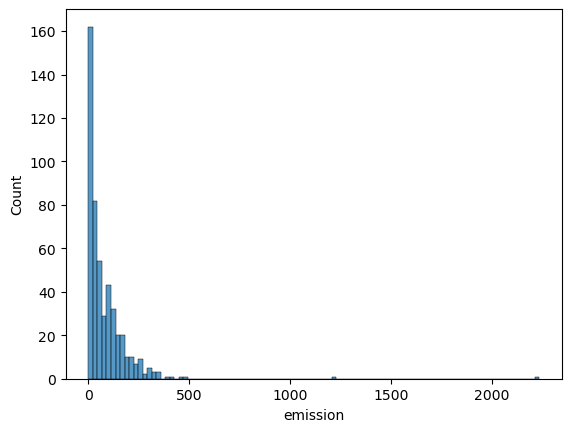

In [74]:
plt.figure(figsize=(6, 3))
sns.histplot(train.groupby(['latitude','longitude'])['emission'].mean().sort_values(), bins=100)
plt.title('Target value histogram')
plt.xlabel('mean target (emission) per location')
plt.ylabel('count')
plt.show()

In [81]:
import matplotlib
from colorama import Fore, Back, Style

Let's plot the mean emission per location on the map. The emissions are color-coded: blue = low emission; red = high emission. We see that the emissions are clustered:
- Points in the west (Democratic Republic of the Congo) all have low emissions.
- The two red points with the highest emissions are both near Lac Kivu.

In [83]:
def rgba_to_hex(color):
    """Return color as #rrggbb for the given color values."""
    red, green, blue, alpha = color
    return f"#{int(red*255):02x}{int(green*255):02x}{int(blue*255):02x}"

temp = train.groupby(['latitude', 'longitude']).emission.mean().reset_index()
geometry = gpd.points_from_xy(temp.longitude, temp.latitude)

cmap = matplotlib.colormaps['coolwarm']
normalizer = matplotlib.colors.Normalize(vmin=np.log1p(temp.emission.min()), vmax = np.log1p(temp.emission.max()))


# Create a canvas to plot your map on
all_data_map = folium.Map(prefer_canvas=True)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in geometry]

# Iterate through list and add a marker for each location
for coordinates, emission in zip(geo_df_list, temp.emission):
#     print(emission, normalizer(emission), rgba_to_hex(cmap(normalizer(emission))))
    # Place the markers 
    all_data_map.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = 1,
            weight = 4,
            zoom =10,
            color = rgba_to_hex(cmap(normalizer(np.log1p(emission))))),
        )
all_data_map.fit_bounds(all_data_map.get_bounds())
all_data_map

Next, we'll plot the time series of the emissions for every location. The plot shows
1. The two locations with very high emissions have special patterns (red and gray); all other locations look similar.
2. Seasonality: There are yearly patterns (which repeat every 53 weeks).

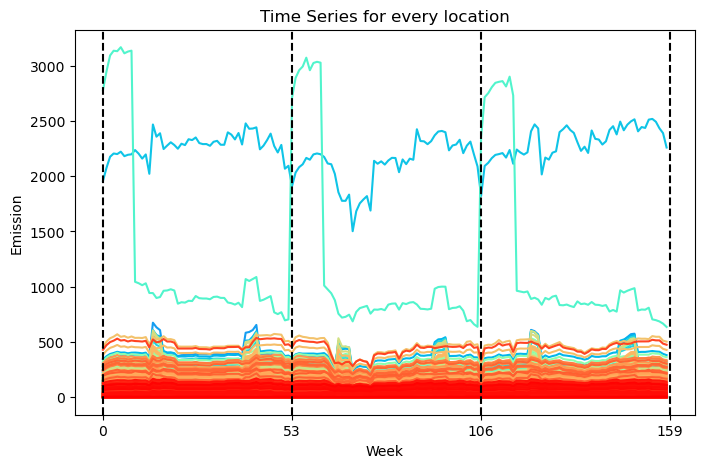

In [99]:
# My method

train_plot = train.pivot_table(index=['year', 'week_no'], columns=['latitude', 'longitude'], values='emission')
train_plot = train_plot.reset_index(drop=True)
train_plot.head(10)


train_plot.plot(figsize=(8,5), cmap='rainbow', legend=False)
for week in [0,53,106,159]: plt.axvline(week, ls='--', color='black')
plt.xticks([0,53,106,159])
plt.xlabel('Week')
plt.ylabel('Emission')
plt.title('Time Series for every location')
plt.show()

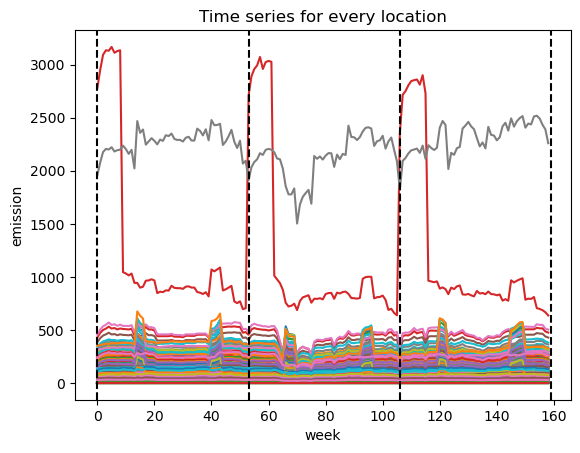

In [100]:
# Author's Method

for l1 in train[['latitude','longitude']].drop_duplicates().iterrows():
    time_series = train[(train.latitude == l1[1].latitude) & (train.longitude == l1[1].longitude)].emission
    plt.plot(range(len(time_series)), time_series)
    
plt.title('Time series for every location')
for week in [0, 53, 106, 159]: plt.axvline(week, color='k', linestyle='--')
plt.xlabel('week')
plt.ylabel('emission')
plt.show()

In [129]:
#### Just for my reference purpose for future use.. How to select from multiindexeing. My own code

# l2 = train[['latitude','longitude']].drop_duplicates().iloc[1,:]
# print(l2)
# print(l2.latitude)
# print(tuple(l2))
# print(tuple(l2) in train_plot.columns)
# train_plot.loc[:,tuple(l2)]   # From The Pivot Table

We can try to identify trends in the emission data. The following diagram shows that the CO2 emissions of most locations got smaller from 2019 to 2020, presumably because of Covid, but increased again from 2020 to 2021. The big question is how this should be extrapolated to 2022...

In [133]:
from matplotlib.ticker import MaxNLocator

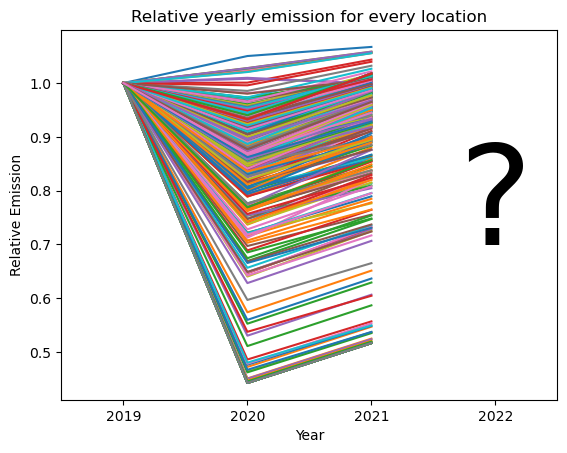

In [135]:
for locs in train[['latitude','longitude']].drop_duplicates().iterrows():
    time_series = train[(train.latitude == locs[1].latitude) & (train.longitude == locs[1].longitude)].groupby(['year'])['emission'].mean()
    time_series = time_series/time_series.loc[2019]
    plt.plot(time_series.index, time_series)
    
plt.title('Relative yearly emission for every location')
plt.xlabel('Year')
plt.ylabel('Relative Emission')
plt.xlim(2018.5, 2022.5)
plt.text(2022, 0.7, "?", fontsize = 100, ha='center')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [184]:
train_plot = train.pivot_table(index=['year', 'week_no'], columns=['latitude', 'longitude'], values='emission')
train_plot = train_plot.reset_index()
train_plot = train_plot.groupby(['year']).mean().drop(['week_no'], axis=1)
train_plot

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17996\3698833606.py:3: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17996\3698833606.py:3: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



latitude,-3.299,-3.287,-3.174,-3.161,-3.153,-3.138,-3.136,-3.133,-3.099,-3.095,...,-0.653,-0.637,-0.627,-0.615,-0.604,-0.598,-0.569,-0.547,-0.528,-0.510
longitude,30.301,29.713,29.926,28.839,30.347,30.662,30.364,29.467,29.601,29.505,...,30.447,30.763,29.773,30.885,29.896,29.102,30.031,29.653,29.472,29.290
year,,,,,,,,,,,,,,,,,,,,,
2019,29.476607,44.422307,46.972412,0.127923,16.573759,26.574813,17.251749,121.541495,80.232408,5.850196,...,34.572609,49.313227,116.439141,88.561256,75.242361,0.091865,119.200662,0.599868,4.388060,4.400329
2020,25.572944,38.950654,42.088758,0.119311,12.742499,21.564079,14.874743,111.908864,74.100961,3.489651,...,33.390578,47.534875,102.345661,80.012134,66.712756,0.085721,110.893002,0.559485,3.878148,4.014550
2021,27.850354,42.860091,45.435848,0.130192,14.191517,23.633884,16.014656,120.366144,79.558491,3.889880,...,34.919143,49.830483,111.965149,86.643062,71.809272,0.093484,118.469624,0.610509,4.284292,4.404019


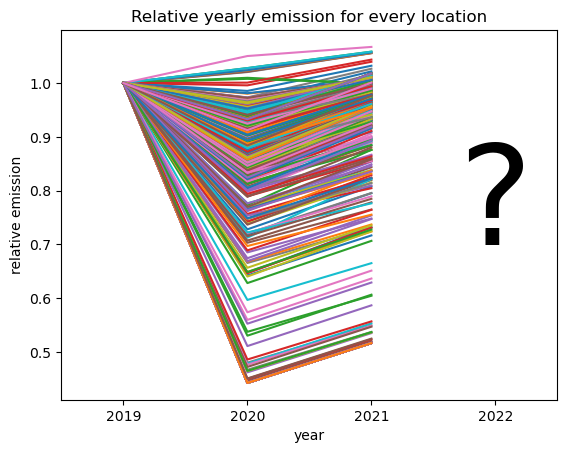

In [183]:
for i in range(1,len(train_plot)):
    train_plot.iloc[i,:] = train_plot.iloc[i,:]/train_plot.iloc[0,:]    
train_plot.iloc[0,:] = train_plot.iloc[0,:]/train_plot.iloc[0,:]

plt.plot(train_plot.index, train_plot);
# train_plot.plot(legend=False)    # Equivalent to 
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.title('Relative yearly emission for every location')
plt.xlabel('year')
plt.ylabel('relative emission')
plt.xlim(2018.5, 2022.5)
plt.text(2022, 0.7, '?', fontsize=100, ha='center')
plt.show()

# Feature distributions

At this point in the notebook, you might expect an analysis of the features.

To make it short: **The satellite measurements are useless.** These features are terribly noisy and unrelated to the target. A satellite measurement applies only to a single point in time whereas the targets are the CO2 emissions of a whole week. The time of the measurement is determined by the satellite's orbit. Its result depends on clouds, temperature, volcano eruptions and other factors. Furthermore, CO2 emissions come from different sectors (ground traffic, heating, power generation, air traffic, …), and these sectors don't contribute proportionally to NO2, CO or SO2. With a diameter of 200 km, Rwanda is a small country, and the wind replaces Rwanda's whole atmosphere with air from neighboring countries every day.

We'll skip the analysis of these data and note that without the satellite measurements, we have only four features left: latitude, longitude, year and week_no.

In [185]:
from sklearn.model_selection import GroupKFold, LeaveOneGroupOut
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import RadiusNeighborsRegressor

# Baseline model

Let's create a very simple baseline model, which only uses the location and the yearly pattern for prediction, i.e., it doesn't look at the satellite's measurements and it doesn't extrapolate any trend. This model doesn't need to impute values because the location and the week are always known. Its prediction for every location and week is simply the average of the emissions of the past years for the same location and week.

You don't need any fancy model for that; a `DecisionTreeRegressor` or a `RadiusNeighborsRegressor(radius=0)` is enough (and both give the same result).

In this competition, we have to predict the year 2022 based on the year 2019, 2020 and 2021. To simulate this prediction task, I'm using `LeaveOneGroupOut` for cross-validation so that the model is trained on two years to predict the third one.

In [187]:
train['year'].isnull().sum()

0

In [195]:
score_list = []
kf = LeaveOneGroupOut()

for fold, (idx_tr, idx_val) in enumerate(kf.split(train, groups=train['year'])):
    X_tr = train.iloc[idx_tr][['longitude', 'latitude', 'week_no']]
    y_tr = train.iloc[idx_tr]['emission']
    X_val = train.iloc[idx_val][['longitude', 'latitude', 'week_no']]
    y_val = train.iloc[idx_val]['emission']
    
    model = RadiusNeighborsRegressor(radius=0) # or DecisionTreeRegressor()
    model.fit(X_tr, y_tr)
    y_val_hat = model.predict(X_val)
    rmse = mean_squared_error(y_val, y_val_hat, squared=False)
    print(f"Fold {fold} year {train.iloc[idx_val].year.iloc[0]} : rmse = {rmse:.2f}")
    score_list.append(rmse)
    
rmse = sum(score_list) / len(score_list)
print(f"Overall RMSE: {rmse:.2f}")

Fold 0 year 2019 : rmse = 20.29
Fold 1 year 2020 : rmse = 27.14
Fold 2 year 2021 : rmse = 19.77
Overall RMSE: 22.40


The baseline model suggests that it is easy to get a score around 22. This score is better than the 27.47 cv score of the official [Getting Started: Modeling](https://www.kaggle.com/code/inversion/getting-started-modeling) notebook, which uses a random forest. The scores are not directly comparable, though, because they are based on different train-test splits.

Note that the year 2020 (RMSE 27) is harder to predict than 2019 (RMSE 20) and 2021 (RMSE 19). 

In [196]:
model = RadiusNeighborsRegressor(radius=0) # or DecisionTreeRegressor()
model.fit(train[['longitude', 'latitude', 'week_no']], train.emission)
y_pred = model.predict(test[['longitude', 'latitude', 'week_no']])
submission_standard = pd.Series(y_pred, name='emission', index=test.index)
submission_standard.to_csv('submission_standard.csv')
submission_standard

ID_LAT_LON_YEAR_WEEK
ID_-0.510_29.290_2022_00     3.608051
ID_-0.510_29.290_2022_01     4.016319
ID_-0.510_29.290_2022_02     4.138755
ID_-0.510_29.290_2022_03     4.184737
ID_-0.510_29.290_2022_04     4.247569
                              ...    
ID_-3.299_30.301_2022_44    28.725407
ID_-3.299_30.301_2022_45    29.048892
ID_-3.299_30.301_2022_46    29.252211
ID_-3.299_30.301_2022_47    29.794027
ID_-3.299_30.301_2022_48    28.759248
Name: emission, Length: 24353, dtype: float64

@oscarm524 has [implemented the same idea in a slightly different way](https://www.kaggle.com/code/oscarm524/ps-s3-ep20-eda-modeling-submission/notebook?scriptVersionId=138618281), got the same predictions (you can compare his [submission file](https://www.kaggle.com/code/oscarm524/ps-s3-ep20-eda-modeling-submission/output?scriptVersionId=138618281)), submitted them and got a leaderboard score of 33.35922.

This high RMSE suggests that either the year 2022 is even harder to predict than 2020 (RMSE 27) or that our method misses something important.

# Extrapolating the trend

Our baseline model doesn't take into account that the time series could have a trend: Maybe Rwanda has constant economic growth, maybe they successfully reduce their carbon dioxide emissions, or the country is still recovering from Covid in 2022. Considering these possibilities, predicting the average of the three preceding years is not the best approach.

The following diagrams show, for every quarter of 2020 and 2021, how much the emissions have grown compared to the same quarter of the previous year. Every dot corresponds to a location. The x axis shows the average emission of the location, and the y axis shows how much the emission has grown (or shrunk). The lines in the diagrams are regression lines which serve to estimate the annual growth rate.

We can clearly identify the Corona effect: Q2/2020 has 23 % lower emissions than Q2/2019. A year later, Corona is overcome: Q2/2021 has 25 % higher emissions than Q2/2020.


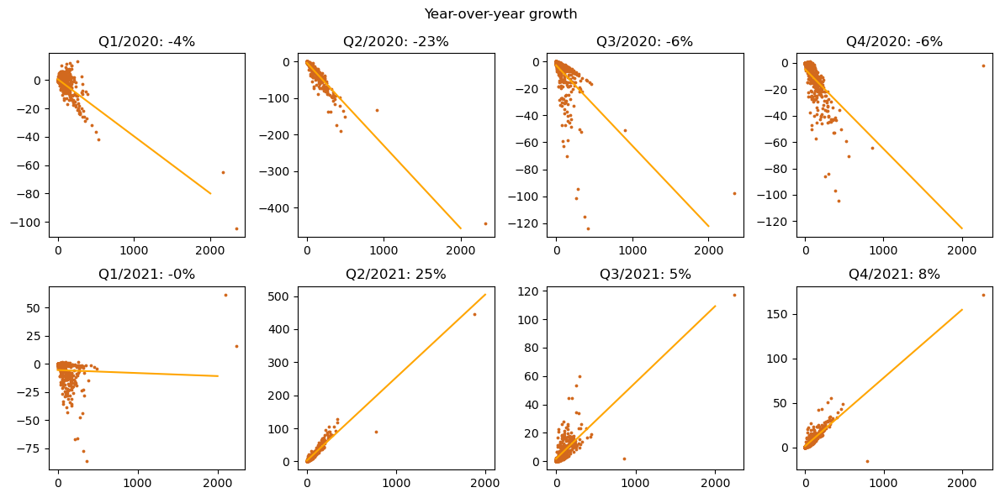

In [224]:
train_plot = train.copy()
train_plot['quarter'] = train_plot['week_no'] // 14 + 1  #Since Every Quarter contains about 14 weeks
grouped = train_plot.groupby(['longitude', 'latitude', 'year', 'quarter'])[['emission']].mean()
grouped = grouped.unstack(['longitude', 'latitude'])    #Transform Multi Level Index of ['coordinates'] into separate columns
delta = 4
one_year_difference = grouped.shift(-delta) - grouped  # Important function for Time series analysis

n_diagrams = 8
_,axs = plt.subplots(2,4,figsize=(12,6))
for i in range(n_diagrams):
    ax = axs.ravel()[i]
    ax.scatter(grouped.iloc[i], one_year_difference.iloc[i], c='chocolate', s=3)
    lr = LinearRegression()
    lr.fit(grouped.iloc[i].values.reshape(-1,1), one_year_difference.iloc[i])
    xs = np.array([[0], [2000]])
    y_pred = lr.predict(xs)
    ax.plot(xs, y_pred, color='orange')
    index = grouped.index[i+delta]
    ax.set_title(f"Q{index[1]}/{index[0]}: {lr.coef_[0]:1.0%}")
    ax.set_xticks([0,1000,2000])
    
plt.suptitle('Year-over-year growth')
plt.tight_layout()
plt.show()

In [219]:
grouped

emission                                                 \
longitude       28.228    28.249    28.297 28.304    28.306    28.311   
latitude        -2.972    -2.451    -1.903 -1.696    -2.794    -2.589   
year quarter                                                            
2019 1        2.938851  3.760941  8.002837    0.0  2.694949  0.993995   
     2        3.260253  4.177623  8.099630    0.0  2.993527  1.100346   
     3        3.414075  4.325612  7.939476    0.0  3.099571  1.173796   
     4        3.043816  3.850720  8.238078    0.0  2.759281  1.049031   
2020 1        2.597742  3.137521  7.030869    0.0  2.248230  0.960573   
     2        1.421726  0.879016  3.541578    0.0  0.629870  0.893221   
     3        1.985640  1.494188  4.937895    0.0  1.070679  1.130642   
     4        1.950144  1.589568  5.354967    0.0  1.139024  1.056898   
2021 1        1.854254  1.530625  5.360630    0.0  1.096788  0.996502   
     2        2.113250  1.824470  5.530411    0.0  1.307346  1.100589   
     3        2.532729  2.505337  6.116193    0.0  1.795230  1.179304   
     4        2.519638  2.587433  6.753921    0.0  1.854057  1.131534   

                                                       ...             \
longitude       28.353    28.364     28.380    28.398  ...     31.396   
latitude        -2.447    -1.536     -2.820    -1.902  ...     -1.004   
year quarter                                           ...              
2019 1        1.874141  1.944333  22.883165  1.988327  ...   8.663740   
     2        2.081780  2.159749  22.674748  2.207571  ...   9.902451   
     3        2.155525  2.236256  22.238518  2.295316  ...  10.242804   
     4        1.918879  1.990746  23.849301  2.044457  ...   9.382929   
2020 1        1.563480  1.622037  21.432054  1.695096  ...   8.441112   
     2        0.438028  0.454434  16.744753  0.647664  ...   8.430295   
     3        0.744579  0.772466  21.428311  0.993608  ...   9.945771   
     4        0.792108  0.821775  21.896209  1.016641  ...   9.498178   
2021 1        0.762736  0.791303  21.603727  0.973073  ...   8.629371   
     2        0.909164  0.943215  22.054361  1.135737  ...  10.029110   
     3        1.248452  1.295210  22.367594  1.467674  ...  10.224318   
     4        1.289362  1.337652  23.861659  1.491846  ...   9.960658   

                                                                            \
longitude         31.397    31.405    31.436    31.442    31.450    31.466   
latitude          -1.203    -1.695    -1.764    -1.858    -0.950    -1.534   
year quarter                                                                 
2019 1        319.108326  0.624166  4.501123  2.515556  1.970163  6.831538   
     2        294.441472  0.860307  5.153894  2.877578  2.385537  7.849653   
     3        270.829084  0.873466  5.287637  2.957517  2.465171  8.098267   
     4        330.275730  0.854964  4.849674  2.711213  2.307374  7.434838   
2020 1        293.282527  0.621954  4.403624  2.458771  1.926986  6.666645   
     2        202.234622  0.779171  4.502675  2.499985  2.040187  6.739648   
     3        261.055828  0.866155  5.159436  2.882635  2.402956  7.877882   
     4        285.526375  0.897501  4.916744  2.747451  2.363239  7.537327   
2021 1        290.235262  0.588781  4.472895  2.501383  1.934865  6.791922   
     2        280.690215  0.908514  5.248259  2.926504  2.442156  7.970737   
     3        272.624843  0.850293  5.260574  2.944699  2.445866  8.071252   
     4        314.933912  0.893004  5.096918  2.855651  2.451128  7.868788   

                                               
longitude       31.494     31.524      31.532  
latitude        -0.806     -1.176      -1.068  
year quarter                                   
2019 1        6.927411  13.405649  295.287936  
     2        7.758005  15.267223  275.943444  
     3        8.025379  15.821373  256.025169  
     4        7.173729  14.471232  305.764697  
2020 1        5.818925  13.046481  271.0868

In [220]:
one_year_difference

emission                                                 \
longitude       28.228    28.249    28.297 28.304    28.306    28.311   
latitude        -2.972    -2.451    -1.903 -1.696    -2.794    -2.589   
year quarter                                                            
2019 1             NaN       NaN       NaN    NaN       NaN       NaN   
     2             NaN       NaN       NaN    NaN       NaN       NaN   
     3             NaN       NaN       NaN    NaN       NaN       NaN   
     4             NaN       NaN       NaN    NaN       NaN       NaN   
2020 1       -0.341109 -0.623420 -0.971968    0.0 -0.446719 -0.033423   
     2       -1.838527 -3.298607 -4.558052    0.0 -2.363657 -0.207124   
     3       -1.428435 -2.831424 -3.001581    0.0 -2.028892 -0.043153   
     4       -1.093672 -2.261152 -2.883111    0.0 -1.620257  0.007867   
2021 1       -0.743489 -1.606897 -1.670239    0.0 -1.151441  0.035929   
     2        0.691524  0.945454  1.988833    0.0  0.677477  0.207368   
     3        0.547090  1.011149  1.178298    0.0  0.724551  0.048662   
     4        0.569494  0.997866  1.398954    0.0  0.715033  0.074636   

                                                      ...            \
longitude       28.353    28.364    28.380    28.398  ...    31.396   
latitude        -2.447    -1.536    -2.820    -1.902  ...    -1.004   
year quarter                                          ...             
2019 1             NaN       NaN       NaN       NaN  ...       NaN   
     2             NaN       NaN       NaN       NaN  ...       NaN   
     3             NaN       NaN       NaN       NaN  ...       NaN   
     4             NaN       NaN       NaN       NaN  ...       NaN   
2020 1       -0.310661 -0.322296 -1.451111 -0.293230  ... -0.222628   
     2       -1.643752 -1.705315 -5.929995 -1.559907  ... -1.472156   
     3       -1.410946 -1.463790 -0.810207 -1.301708  ... -0.297033   
     4       -1.126770 -1.168971 -1.953092 -1.027816  ...  0.115249   
2021 1       -0.800744 -0.830734  0.171672 -0.722023  ...  0.188259   
     2        0.471136  0.488781  5.309608  0.488073  ...  1.598814   
     3        0.503873  0.522744  0.939283  0.474066  ...  0.278548   
     4        0.497253  0.515877  1.965450  0.475206  ...  0.462480   

                                                                           \
longitude        31.397    31.405    31.436    31.442    31.450    31.466   
latitude         -1.203    -1.695    -1.764    -1.858    -0.950    -1.534   
year quarter                                                                
2019 1              NaN       NaN       NaN       NaN       NaN       NaN   
     2              NaN       NaN       NaN       NaN       NaN       NaN   
     3              NaN       NaN       NaN       NaN       NaN       NaN   
     4              NaN       NaN       NaN       NaN       NaN       NaN   
2020 1       -25.825799 -0.002211 -0.097499 -0.056786 -0.043176 -0.164893   
     2       -92.206850 -0.081135 -0.651219 -0.377593 -0.345350 -1.110004   
     3        -9.773256 -0.007311 -0.128201 -0.074882 -0.062215 -0.220385   
     4       -44.749355  0.042537  0.067069  0.036238  0.055865  0.102489   
2021 1        -3.047265 -0.033173  0.069271  0.042613  0.007879  0.125277   
     2        78.455593  0.129343  0.745584  0.426518  0.401970  1.231089   
     3        11.569015 -0.015863  0.101137  0.062064  0.042911  0.193370   
     4        29.407536 -0.004497  0.180174  0.108200  0.087889  0.331461   

                                             
longitude       31.494    31.524     31.532  
latitude        -0.806    -1.176     -1.068  
year quarter                                 
2019 1             NaN       NaN        NaN  
     2             NaN       NaN        NaN  
     3             NaN       NaN        NaN  
     4             NaN       NaN        NaN  
2020 1       -1.108486 -0.359168 -24.201136  
     2       -5.891148 -2.348790 -89.594867  
     3       -5

The final two quarters of the training data show annual growth rates of 5 % and 8 %. May we assume that the emissions will continue growing in 2022?

In the following cell we retrain our model on the full training data. The model predicts the average emissions of 2019-2021, which are exceptionally low because of Covid. It is therefore a legitimate attempt at extrapolation if we add 5 % to these predictions before submitting. 

There are a few subtleties to consider, though:
- The Covid effect is particularly strong in Q2. The Q2 predictions should probably get a higher adjustment than the rest.
- The diagrams above show how badly linear regression behaves when there are outliers. In the diagrams for Q4/2020 and Q1/2021, you can see how one or two outliers lead to a completely wrong regression line and to bad estimates for the annual growth rate.
- As @ravi20076 has found out, the public leaderboard [consists of the first 20 weeks of 2022](https://www.kaggle.com/competitions/playground-series-s3e20/discussion/428405). The growth rate for the rest of 2022 will likely differ from the one for the first 20 weeks.
- Maybe the trend shouldn't be extrapolated at all, but determined from the satellite observations. Covid should have had an effect on SO2, NO2 and other concentrations, and these concentrations, measured in 2022, should reveal the correct trend for the CO2 emissions. 

**Insight:**
- Try to use the satellite observations to determine the trend of the emissions - maybe not per location, but just as an overall trend.
- Extrapolate the time series through guessing only if the satellite observations don't reveal the trend.

In [225]:
# Extrapolation of the growth trend - feel free to change the factor
submission_plus5 = submission_standard * 1.05
submission_plus5.to_csv('submission_plus5.csv')
submission_plus5

ID_LAT_LON_YEAR_WEEK
ID_-0.510_29.290_2022_00     3.788453
ID_-0.510_29.290_2022_01     4.217135
ID_-0.510_29.290_2022_02     4.345693
ID_-0.510_29.290_2022_03     4.393974
ID_-0.510_29.290_2022_04     4.459947
                              ...    
ID_-3.299_30.301_2022_44    30.161677
ID_-3.299_30.301_2022_45    30.501336
ID_-3.299_30.301_2022_46    30.714822
ID_-3.299_30.301_2022_47    31.283728
ID_-3.299_30.301_2022_48    30.197210
Name: emission, Length: 24353, dtype: float64

# Without extrapolation

I admit that manually adjusting predictions may not be the most scientific method. As an alternative, let's simply drop the 53 weeks most affected by Covid as outliers:

In [229]:
train_nocovid = train[(train['year'] == 2019) | 
                      (train['year'] == 2020) & (train['week_no'] <= 8) |
                      (train['year'] == 2021) & (train['week_no'] >= 8)]

model = DecisionTreeRegressor()
model.fit(train_nocovid[['latitude','longitude','week_no']], train_nocovid[['emission']])
y_hat = model.predict(test[['latitude','longitude','week_no']])
submission_nocovid = pd.Series(y_hat, name = 'emission', index = test.index)
submission_nocovid.to_csv('submission_nocovid.csv')
submission_nocovid

ID_LAT_LON_YEAR_WEEK
ID_-0.510_29.290_2022_00     3.752297
ID_-0.510_29.290_2022_01     4.038571
ID_-0.510_29.290_2022_02     4.192749
ID_-0.510_29.290_2022_03     4.235518
ID_-0.510_29.290_2022_04     4.290476
                              ...    
ID_-3.299_30.301_2022_44    29.836845
ID_-3.299_30.301_2022_45    30.249885
ID_-3.299_30.301_2022_46    30.432125
ID_-3.299_30.301_2022_47    30.868620
ID_-3.299_30.301_2022_48    29.674269
Name: emission, Length: 24353, dtype: float64

Let's compare the three predictions for the test set in a diagram:
- `standard` is based on the full training set, without any extrapolation. Most of the time, these predictions are too low.
- `plus5` corresponds to the standard predictions increased by 5 %.
- `nocovid` is the result of dropping the Covid weeks in the training data as outliers. These predictions are sometimes higher, sometimes lower than the `plus5` predictions. I'd trust these predictions the most.

@danbraswell has invented another method of dealing with the Covid outliers: Assuming that the Covid emissions are always lower than the regular ones, he published a notebook which simply predicts the maximum emissions over the three years: [No ML; public LB 23.02231](https://www.kaggle.com/code/danbraswell/no-ml-public-lb-23-02231).

**Insight:**
- We don't need to extrapolate. Dropping outliers may be the better method.
- The peculiarity of this competition (only three years of training data, of which one is barely usable) forces us to be creative.

,standard,plus5,nocovid
ID_LAT_LON_YEAR_WEEK,,,
ID_-0.510_29.290_2022_00,3.608051,3.788453,3.752297
ID_-0.510_29.290_2022_01,4.016319,4.217135,4.038571
ID_-0.510_29.290_2022_02,4.138755,4.345693,4.192749
ID_-0.510_29.290_2022_03,4.184737,4.393974,4.235518
ID_-0.510_29.290_2022_04,4.247569,4.459947,4.290476


<Figure size 800x300 with 0 Axes>

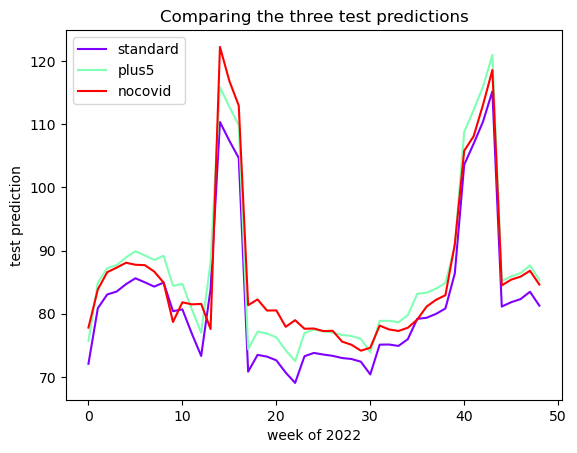

In [271]:
### My Method

compare_preds = pd.DataFrame({'standard' : submission_standard, 'plus5' : submission_plus5, 'nocovid' : submission_nocovid})
display(compare_preds.head())

plt.figure(figsize=(8, 3))
compare_preds.groupby(test.week_no).mean().plot(cmap='rainbow')
plt.title("Comparing the three test predictions")
plt.xlabel('week of 2022')
plt.ylabel('test prediction')
plt.show()

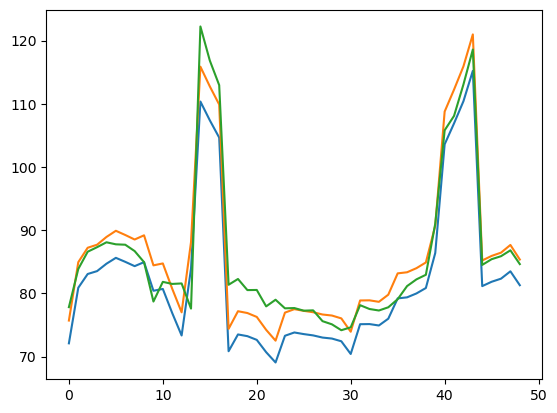

In [276]:
compare_preds = pd.DataFrame({'standard' : submission_standard, 'plus5' : submission_plus5, 'nocovid' : submission_nocovid})
#display(compare_preds.head())
plt.plot(range(49), compare_preds.groupby(test.week_no).mean())  # But It won't cmap with colums

In [248]:
display(submission_standard)
display(test.week_no)
submission_standard.groupby(test.week_no).mean()[:10]
# It is grouping based on column of test week no based on same ID of both the different dataset

ID_LAT_LON_YEAR_WEEK
ID_-0.510_29.290_2022_00     3.608051
ID_-0.510_29.290_2022_01     4.016319
ID_-0.510_29.290_2022_02     4.138755
ID_-0.510_29.290_2022_03     4.184737
ID_-0.510_29.290_2022_04     4.247569
                              ...    
ID_-3.299_30.301_2022_44    28.725407
ID_-3.299_30.301_2022_45    29.048892
ID_-3.299_30.301_2022_46    29.252211
ID_-3.299_30.301_2022_47    29.794027
ID_-3.299_30.301_2022_48    28.759248
Name: emission, Length: 24353, dtype: float64

ID_LAT_LON_YEAR_WEEK
ID_-0.510_29.290_2022_00     0
ID_-0.510_29.290_2022_01     1
ID_-0.510_29.290_2022_02     2
ID_-0.510_29.290_2022_03     3
ID_-0.510_29.290_2022_04     4
                            ..
ID_-3.299_30.301_2022_44    44
ID_-3.299_30.301_2022_45    45
ID_-3.299_30.301_2022_46    46
ID_-3.299_30.301_2022_47    47
ID_-3.299_30.301_2022_48    48
Name: week_no, Length: 24353, dtype: int64

week_no
0    72.088003
1    80.885773
2    83.061364
3    83.517704
4    84.689304
5    85.618840
6    84.984527
7    84.303210
8    84.936751
9    80.408753
Name: emission, dtype: float64

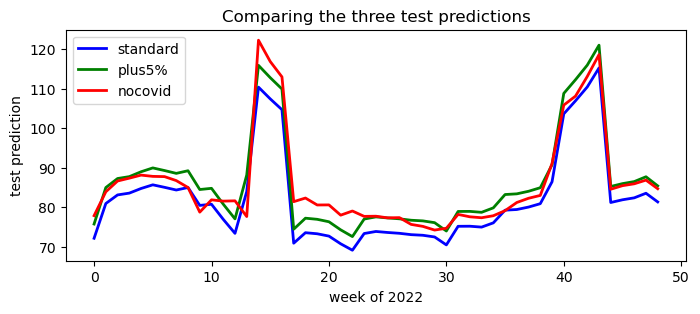

In [250]:
# Authors Method

plt.figure(figsize=(8, 3))
plt.title("Comparing the three test predictions")
plt.xlabel('week of 2022')
plt.ylabel('test prediction')
plt.plot(range(49), submission_standard.groupby(test.week_no).mean(), label='standard', lw=2, color='b')
plt.plot(range(49), submission_plus5.groupby(test.week_no).mean(), label='plus5%', lw=2, color='g')
plt.plot(range(49), submission_nocovid.groupby(test.week_no).mean(), label='nocovid', lw=2, color='r')
plt.legend()
plt.show()

# Dimensionality reduction

As a part of EDA, many data scientists look for correlations between features (or more general, for linear dependencies). If they find high correlations, they drop features or reduce the dimensionality of the data by some other method.

For our CO2 emission dataset, we take a different approach. There are 497 locations. Do you expect the CO2 measurements for the 497 locations to be all independent? Probably not. Several phenomena could cause dependence between measurements from different locations:
1. If wind and atmospheric turbulence are strong enough, nearby locations basically measure the same air, and the measurement results should be similar.
2. If economical and political phenomena affect the CO2 emissions, the effect will be the similar over the whole country.
3. (Seasonal) natural phenomena such as growth of plants, dominant wind, rainy season or [volcanoes](https://www.kaggle.com/competitions/playground-series-s3e20/discussion/429232) affect the whole country similarly.

The dependencies between emissions do not necessarily relate to the distances between their locations: Maybe the locations have different emission patterns because some sensors are placed in cities and others in the forest. We could analyze such dependencies by clustering the time series of the locations. (For an example of how the locations can be clustered, see @patrick0302's notebook [Clustering might help😎](https://www.kaggle.com/code/patrick0302/clustering-might-help))

For now, I want to see the linear dependencies between locations. To start, we reshape the data into a pivot table of emissions which has one row for every location and one column for every week of the training data. In other words, every row is the time series of a location:


In [278]:
emission = train.pivot(index=['latitude', 'longitude'], columns=['year', 'week_no'], values='emission')
display(emission)
with pd.option_context('display.max_columns', 6, "display.max_rows", 6):
    display(emission)

year                      2019                                      \
week_no                     0           1           2           3    
latitude longitude                                                   
-3.299   30.301      26.111166   28.045977   29.293518   29.950650   
-3.287   29.713      39.696404   43.529408   45.993286   47.163128   
-3.174   29.926      41.193130   43.877285   45.760826   46.675327   
-3.161   28.839       0.106631    0.112878    0.118181    0.119753   
-3.153   30.347      15.069341   16.217907   16.811665   17.231894   
...                        ...         ...         ...         ...   
-0.598   29.102       0.076542    0.081001    0.084788    0.085920   
-0.569   30.031     100.382980  106.375980  110.766335  113.097940   
-0.547   29.653       0.500023    0.529315    0.554183    0.561553   
-0.528   29.472       3.857115    4.213432    4.451489    4.553981   
-0.510   29.290       3.750994    4.025176    4.231381    4.305286   

year                                                                \
week_no                     4           5           6           7    
latitude longitude                                                   
-3.299   30.301      30.572742   30.043688   30.064514   29.540133   
-3.287   29.713      48.742470   47.126740   47.476020   46.340473   
-3.174   29.926      47.317184   46.827750   46.567710   45.939754   
-3.161   28.839       0.119364    0.120299    0.118002    0.118644   
-3.153   30.347      17.642060   17.182430   17.348898   17.046635   
...                        ...         ...         ...         ...   
-0.598   29.102       0.085650    0.086405    0.084759    0.085190   
-0.569   30.031     114.985886  117.219720  116.462480  114.035280   
-0.547   29.653       0.559731    0.564116    0.553346    0.556356   
-0.528   29.472       4.676066    4.547773    4.560501    4.482812   
-0.510   29.290       4.347317    4.310819    4.269334    4.251361   

year                                        ...        2021              \
week_no                     8           9   ...          43          44   
latitude longitude                          ...                           
-3.299   30.301      29.795696   30.813670  ...   30.141666   29.346270   
-3.287   29.713      47.119620   47.097004  ...   45.896976   46.181232   
-3.174   29.926      46.116320   48.864970  ...   48.809760   46.763184   
-3.161   28.839       0.118724    0.123154  ...    0.136329    0.133347   
-3.153   30.347      17.285320   17.126566  ...   15.564887   15.680665   
...                        ...         ...  ...         ...         ...   
-0.598   29.102       0.085231    0.088540  ...    0.098056    0.095698   
-0.569   30.031     113.942320  123.436360  ...  133.926060  122.317180   
-0.547   29.653       0.556730    0.577506  ...    0.639289    0.625299   
-0.528   29.472       4.551896    4.516072  ...    4.542092    4.601799   
-0.510   29.290       4.281937    4.352933  ...    4.629182    4.600272   

year                                                                \
week_no                     45          46          47          48   
latitude longitude                                                   
-3.299   30.301      29.688602   29.701365   30.297634   29.404171   
-3.287   29.713      46.249504   46.270954   46.455006   47.328110   
-3.174   29.926      47.626120   47.619976   49.147602   46.265680   
-3.161   28.839       0.135766    0.135322    0.139941    0.136397   
-3.153   30.347      15.678098   15.700193   15.649941   16.179245   
...                        ...         ...         ...         ...   
-0.598   29.102       0.097470    0.097157    0.100530    0.097723   
-0.569   30.031     125.746230  125.857475  131.878270  116.865940   
-0.547   29.653       0.636647    0.634561    0.656226    0.639599   
-0.528   29.472       4.610928    4.607654    4.632980    4.770357   
-0.510   29.290       4.652008    4.641428    4.743777    4.736880   

year  

year                     2019                        ...       2021  \
week_no                    0          1          2   ...         50   
latitude longitude                                   ...              
-3.299   30.301     26.111166  28.045977  29.293518  ...  29.131205   
-3.287   29.713     39.696404  43.529408  45.993286  ...  46.808056   
-3.174   29.926     41.193130  43.877285  45.760826  ...  45.675720   
...                       ...        ...        ...  ...        ...   
-0.547   29.653      0.500023   0.529315   0.554183  ...   0.618269   
-0.528   29.472      3.857115   4.213432   4.451489  ...   4.683615   
-0.510   29.290      3.750994   4.025176   4.231381  ...   4.607418   

year                                      
week_no                    51         52  
latitude longitude                        
-3.299   30.301     28.125792  27.239302  
-3.287   29.713     44.268930  43.260082  
-3.174   29.926     44.668972  42.904007  
...                       ...        ...  
-0.547   29.653      0.609128   0.575292  
-0.528   29.472      4.450044   4.318747  
-0.510   29.290      4.470275   4.269510  

[497 rows x 159 columns]

In the next step, we apply a [singular value decomposition (SVD)](https://scikit-learn.org/stable/modules/decomposition.html#lsa) to the data. (You could use a [PCA](https://scikit-learn.org/stable/modules/decomposition.html#pca) or [ICA](https://scikit-learn.org/stable/modules/decomposition.html#ica) and get similar results).

We plot the [cumulative explained variance](https://www.google.com/search?client=firefox-b-d&q=cumulative+explained+variance), and surprisingly the first five components explain almost all the variance. This is quite remarkable: It means that the emissions of the 495 locations all are linear combinations of the emissions of only five basis locations!

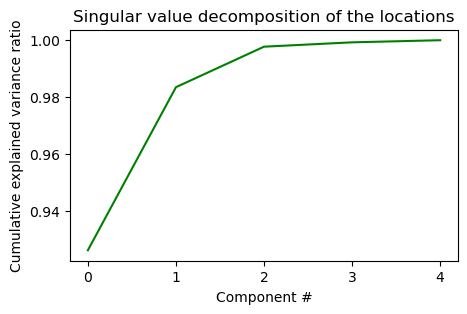

In [279]:
svd = TruncatedSVD(n_components=5)
svd.fit(emission)

plt.figure(figsize=(5,3))
plt.plot(svd.explained_variance_ratio_.cumsum(), color='g')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.title('Singular value decomposition of the locations')
plt.ylabel('Cumulative explained variance ratio')
plt.xlabel('Component #')
plt.show()

A heatmap of the five singular vectors shows some patterns:
- Vector 1 shows seasonal peaks every January and February.
- Vector 2 shows seasonal peaks in May and October.
- Vector 3 shows a sudden change in emissions around week 8 of 2020. This is the Covid effect.

In [281]:
print(svd.components_.shape)     #--> B Matrix
print(svd.transform(emission).shape)   # ---> A matrix

(5, 159)
(497, 5)


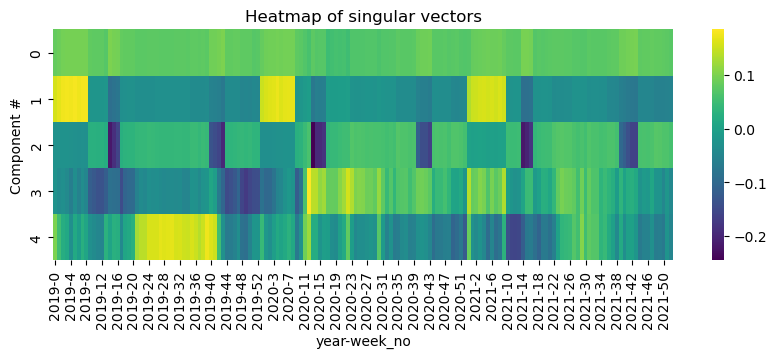

In [283]:
plt.figure(figsize=(10,3))
sns.heatmap(pd.DataFrame(svd.components_, columns = emission.columns), cmap='viridis')
plt.ylabel('Component #')
plt.title('Heatmap of singular vectors')
plt.show()

We now project the 495 locations to the first two principal components and mark four representative locations:

In [291]:
print(svd.fit_transform(emission).shape)

embedding = pd.DataFrame(svd.fit_transform(emission), index=emission.index) # 5 columns
print(svd.inverse_transform(embedding).shape)

with pd.option_context('display.max_columns', 6, "display.max_rows", 6):
    display(embedding)

(497, 5)
(497, 159)


,,0,1,2,3,4
latitude,longitude,,,,,
-3.299,30.301,348.544254,-16.055927,26.664935,-9.491554,0.199119
-3.287,29.713,531.775077,-16.456463,39.938081,-19.864472,-14.507285
-3.174,29.926,564.077106,-33.032219,46.034458,-1.260088,4.539892
...,...,...,...,...,...,...
-0.547,29.653,7.393733,-0.630877,0.790199,0.272923,0.225351
-0.528,29.472,52.790773,-2.173957,4.503981,-1.295334,-0.763380
-0.510,29.290,53.699776,-3.612113,5.298779,0.640787,0.668565


In [292]:
embedding.loc[(-2.378, 29.222)]    # If multilevel index, then pass it as a tuple for indexing

0    28080.853700
1    -2088.272733
2     2193.569336
3      739.443266
4      325.634540
Name: (-2.378, 29.222), dtype: float64

In [295]:
embedding.loc[(-2.378, 29.222)].values[[0]]   #First Principal Component Value of gicen coordinates
embedding.loc[(-2.378, 29.222)].values[[1]]   #Second Principal Component Value of gicen coordinates

array([28080.8537003])

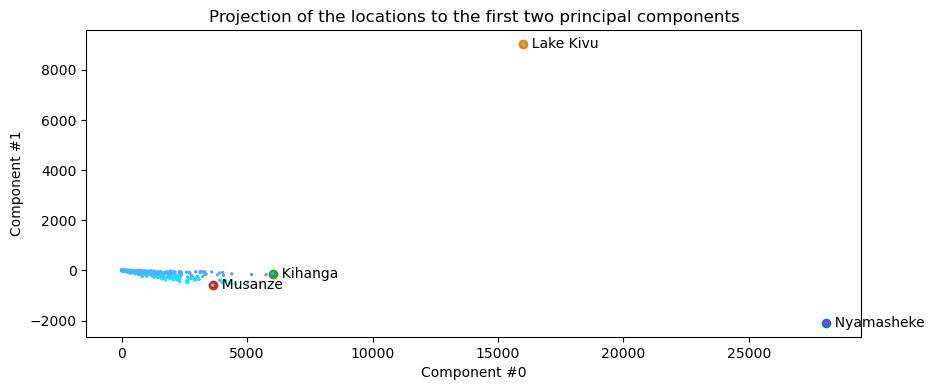

In [298]:
# Special locations (latitude, longitude)
named_loc = {'Nyamasheke': (-2.378, 29.222),
             'Lake Kivu': (-2.079, 29.321),
             'Kihanga': (-1.346, 31.254),
             'Musanze': (-1.514, 29.686),
            }

embedding = pd.DataFrame(svd.fit_transform(emission), index = emission.index) # 5 columns
denoised_emission = pd.DataFrame(svd.inverse_transform(embedding), columns = emission.columns, index = emission.index)

cx,cy, cc = 0, 1, 2
plt.figure(figsize=(10, 10))
plt.gca().set_aspect('equal')
for name, coord in named_loc.items():
    plt.scatter(embedding.loc[coord].values[[cx]], embedding.loc[coord].values[[cy]])
    plt.text(embedding.loc[coord].values[[cx]], embedding.loc[coord].values[[cy]], '  ' + name, va='center')
    
    
plt.scatter(embedding.values.T[cx], embedding.values.T[cy], s=2, c=embedding.values.T[cc], cmap='cool')  #Look for c and cmap both
plt.title('Projection of the locations to the first two principal components')
plt.xlabel(f'Component #{cx}')
plt.ylabel(f'Component #{cy}')
plt.show()

The four marked locations are special indeed:
- Nyamasheke has the highest average emission.
- Lake Kivu has high peaks every January and February.
- Kihanga has no seasonal peaks.
- Musanze has seasonal peaks every May and October.

The time series of all other locations are linear combinations of these four plus a fifth basis location.

Note that we are not looking for outliers here: All 497 locations occur in train and in test. We have to predict emissions for all of them, and this implies that we should train on all locations. We may drop some weeks as outliers, but we must not drop any location as outlier.

Text(0, 0.5, 'emission')

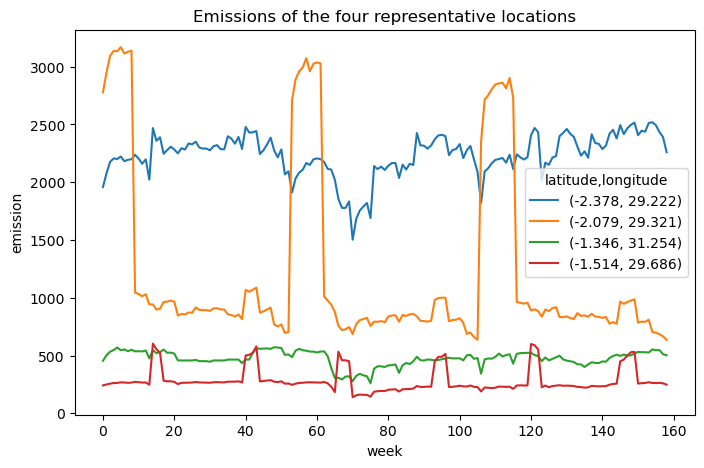

In [313]:
# My Method

train_plot = train.pivot_table(index=['year', 'week_no'], columns =['latitude','longitude'], values='emission')
train_plot = train_plot.loc[:,[values for values in named_loc.values()]]
train_plot = train_plot.reset_index(drop=True)
train_plot.plot(figsize=(8,5))
plt.title('Emissions of the four representative locations')
plt.xlabel('week')
plt.ylabel('emission')

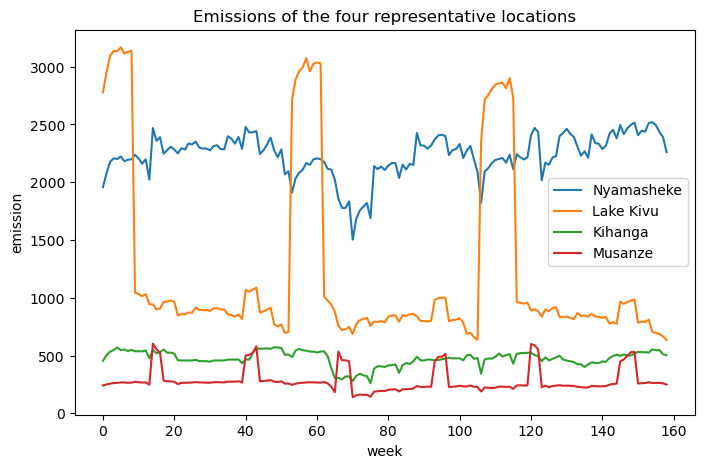

In [314]:
# Author's Method

plt.figure(figsize=(8,5))
for name, coord in named_loc.items():
    plt.plot(range(3*53), emission.loc[coord], label=name)
plt.title('Emissions of the four representative locations')
plt.xlabel('week')
plt.ylabel('emission')
plt.legend()
plt.show()

**Insight:**
- We don't need to predict 497 independent time series for 2022. It suffices to predict 5 basis time series, and all others can be derived.
- The huge dimensionality reduction (100 % explained variance ratio with only five components) wouldn't be possible if the measurements came from real sensors. It indicates that the emission data was generated artificially.
- I don't yet know how the information about the dimensionality reduction will help improve leaderboard scores, but I'm sure it will... 😉
---

---
# Holt-Winters exponential smoothing

There are many statistical methods specific to time series; Holt-Winters exponential smoothing is one of them.

The Holt-Winters method is based on three ideas:
1. As a first approach to predicting the next value in a time sequence, we can simply predict a weighted average of the most recent values (where the most recent value has the highest weight).
2. Holt extends this method by estimating the trend of the time series and adding the estimated trend to the weighted average of the most recent values.
3. The Holt-Winters method adds an estimation of the seasonality to the first two elements.

There are many tutorials for Holt-Winters on the Internet, for instance [here](https://otexts.com/fpp3/expsmooth.html) or [here](https://timeseriesreasoning.com/contents/holt-winters-exponential-smoothing/).

In the following piece of code, we use `statsmodels.tsa.holtwinters.ExponentialSmoothing` to predict the test emissions for four representative locations. The main hyperparameter which must be set is the length of the period (`seasonal_periods=53`).

In [321]:
import statsmodels.api

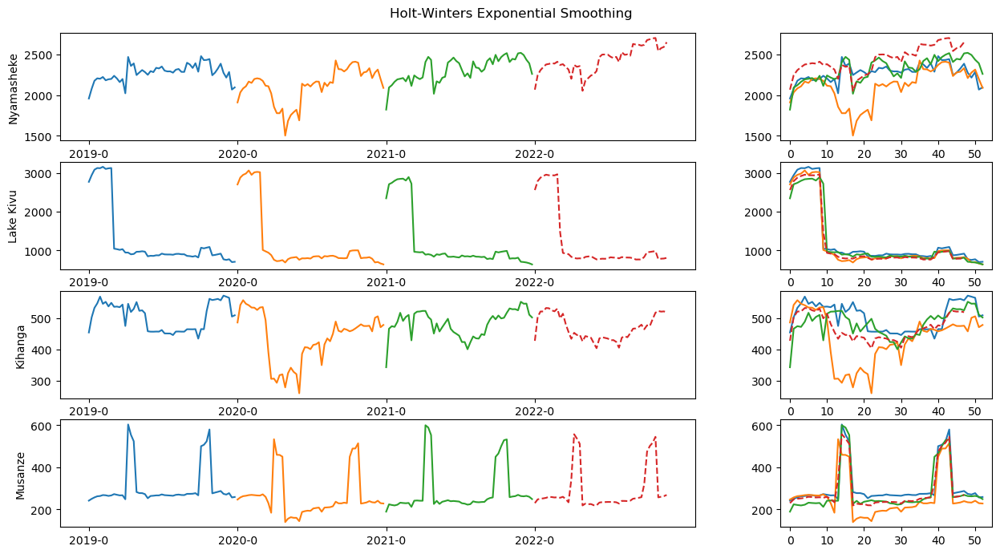

In [322]:
emission = train.pivot(index=['year', 'week_no'], columns=['latitude', 'longitude'], values='emission')

_,axes = plt.subplots(len(named_loc), 2, width_ratios=[3,1], figsize=(15,8))

for(label, coord), ax in zip(named_loc.items(), axes):
    train_series = emission[coord].values
    es = statsmodels.tsa.holtwinters.ExponentialSmoothing(train_series, seasonal_periods = 53, trend='add', seasonal = 'add')
    es = es.fit()
    test_pred = es.forecast(steps=48)
    for j in range(3):
        ax[0].plot(np.arange(j*53, j*53+53), train_series.reshape(3,53)[j])
    ax[0].plot(np.arange(159,159+48), test_pred, '--')
    ax[0].set_ylabel(label)
    ax[0].set_xticks([0,53,106,159], [f"{2019+week//53}-0" for week in [0,53,106,159]])
    
    ax[1].plot(train_series.reshape(3,53).T)
    ax[1].plot(test_pred, '--')
    
    plt.suptitle('Holt-Winters Exponential Smoothing', y=0.92)
    
plt.savefig('holt-winters.png', bbox_inches='tight')
plt.show()

# Nonnegative matrix factorization explains the low dimensionality

The target values ('emission') of our dataset are not measurements, but estimates. This fact explains why the data is low-dimensional.  Through [nonnegative matrix factorization (NMF)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.NMF.html), we can understand how the data was generated.

Imagine that you want to estimate CO2 emissions for thousands of locations (the competition data shows only a subset). To get thousands of estimates efficiently, you cannot look at every location in detail, but you can simplify your work by dividing the problem into two sub-problems:
1. Estimate the emission patterns for different sectors of the economy, e.g. residential buildings, commercial buildings, ground traffic, air traffic, ... Every sector has a characteristic pattern:
  - Residential buildings emit the most CO2 during cold seasons (because of heating) or during hot seasons (because of cooling). Their emissions don't change much during the lockdown.
  - Commercial buildings emit more CO2 during the week than on week-ends.
  - Ground traffic doesn't depend on the season, but is reduced during lockdowns.
  - Air traffic might have seasonal peaks during vacation periods and is reduced during lockdowns.
2. For every location, estimate the contribution of the sectors (components) defined above:
  - A rural location has residential buildings, but few commercial buildings.
  - A city has a higher contribution from commercial buildings.
  - A freeway through a forest has ground traffic emissions, but no buildings.
  - The emissions of an airport location follow the seasonal peaks of air traffic and depend on the size of the airport.
  
The result of this process can be described by two matrices. The first matrix (let's call it B) shows the emission pattern (time series) of every sector in its rows:

<table border="1" class="dataframe" style="margin-right:auto;margin-left:0px">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>week 1</th>
      <th>week 2</th>
      <th>week 3</th>
      <th>week 4</th>
      <th>week 5</th>
      <th>...</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>Residential</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Commercial</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Ground traffic</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Air traffic</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>...</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
  </tbody>
</table>
<br>

The second matrix (let's call it A) shows the contributions of the components to every location:

<table border="1" class="dataframe" style="margin-right:auto;margin-left:0px">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Residential</th>
      <th>Commercial</th>
      <th>Ground traffic</th>
      <th>Air traffic</th>
      <th>...</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>Location 1</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Location 2</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Location 3</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>...</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
  </tbody>
</table>
<br>

A simple matrix multiplication (X = A @ B) then gives estimates for all locations and times:

<table border="1" class="dataframe" style="margin-right:auto;margin-left:0px">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>week 1</th>
      <th>week 2</th>
      <th>week 3</th>
      <th>week 4</th>
      <th>week 5</th>
      <th>...</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>Location 1</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Location 2</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>Location 3</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
    <tr>
      <th>...</th>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
      <td></td>
    </tr>
  </tbody>
</table>
<br>

In this competition, we got only X, but not A and B. Can we recover A and B from X? Yes, this is possible. Note that all elements of A, B and X are nonnegative (emissions are never negative, nor are the contributions of the sectors). This nonnegativity enables us to recover the matrices A and B by [nonnegative matrix factorization (NMF)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.NMF.html). Nonnegative matrix factorization reduces the dataset dimensionality in a similar way as an SVD, but it makes sure that all matrix entries are nonnegative.

Above in this notebook, in the section on dimensionality reduction, I said that five dimensions were enough. For the NMF I'll use six dimensions anyway. This means that there are six sectors, A has six columns, and B has six rows. The six rows of B can be shown as time series in a diagram: 

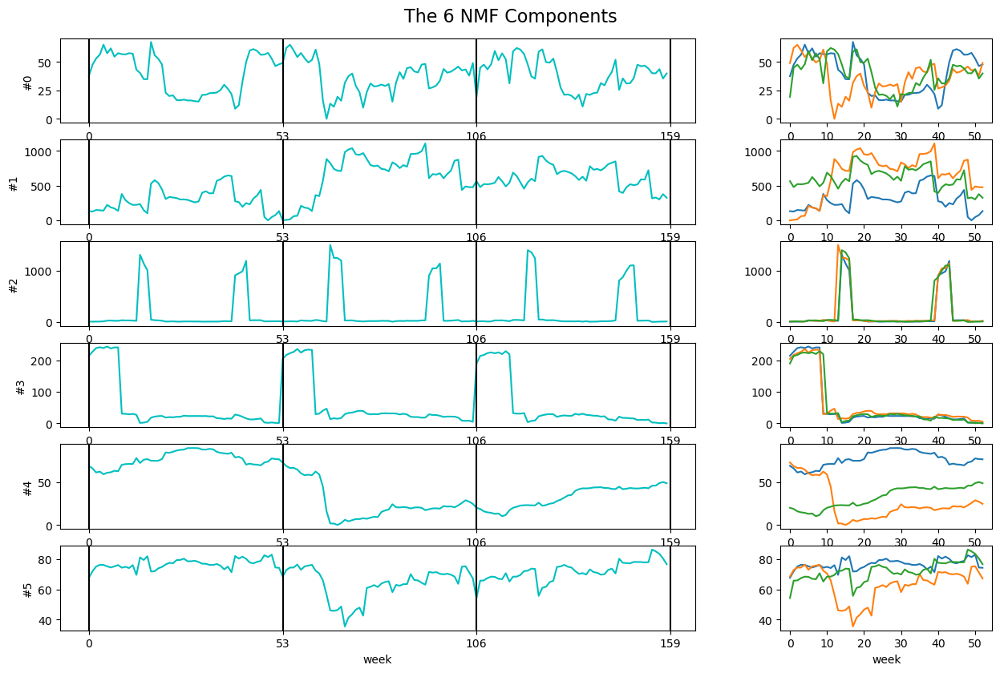

In [323]:
X = train.pivot(index=['latitude', 'longitude'], columns=['year', 'week_no'],
                values='emission')
X.sort_index(level='latitude', ascending=False, inplace=True) # sort like test dataframe
n_components=6
nmf = NMF(n_components=n_components, solver='cd', tol=1e-8, max_iter=50000,
          random_state=1)
nmf.fit(X)
embedding = pd.DataFrame(nmf.transform(X), index=X.index)
# Matrix B = nmf.components_ = every row is the time series of a sector
# Matrix A = nmf.transform(X) = every row shows the contributions to a location

_, axes = plt.subplots(n_components, 2, width_ratios=[3, 1],
                       figsize=(15, n_components*1.6))
for i, ax in enumerate(axes):
    ax[0].plot(nmf.components_[i], color='c')
    for x in [0, 53, 106, 159]: ax[0].axvline(x, color='k')
    ax[0].set_xticks([0, 53, 106, 159])
    ax[0].set_ylabel(f"#{i}")

    ax[1].plot(nmf.components_[i].reshape(3, 53).T)
axes[n_components-1, 0].set_xlabel('week')
axes[n_components-1, 1].set_xlabel('week')
plt.suptitle('The 6 NMF Components', fontsize=16, y=0.92)
plt.show()


Notice
- Every row has another seasonal pattern.
- Components \#2 and \#3 are periodic — they are not affected by Covid.
- Component \#1 has an inverse Covid effect: The emissions go up in 2020.

**Insight**:
- Sometimes an NMF gives more interpretable results than an SVD.

The information about the estimation process has been taken from https://carbonmonitor-graced.com/methods.html#background (which is acknowledged on the competition homepage).

---
---

---
---
# Hiding behind seasonality: the Covid recovery curve

During the past days, this competition has somewhat changed into a trial-and-error game. Let's get back to data science! I'd like to propose a new time series model. The model is based on the assumption that every series of emission values in this competition is a sum of three components:

1. a seasonal component which repeats every year (green in the diagram)
2. a Covid shock in week 63, followed by a gradual recovery process (red in the diagram)
3. a bit of noise (as always) (included in the red line)


Extrapolation of the components to get the test predictions is straightforward:

1. The seasonal component in 2022 is the same as every year.
2. The Covid recovery process is modeled as an exponential decay with obvious continuation.
3. The noise doesn't need to be extrapolated.


Key to the model is of course that you can separate the seasonal component from the Covid recovery component.

I'll apply this model to the six components of the nonnegative matrix decomposition of my earlier discussion post NMF explains how the data was generated. The following diagram shows the decomposition of each NMF time series into a seasonal component (green) with a period of 53 weeks and a Covid (+ noise) component (red). Every target value is a sum of red and green, so if you can predict red and green, you're done:

---

Let's implement another time series model. For the model, I assume that every series of emission values in this competition is a sum of three components:
1. a seasonal component which repeats every year (green in the diagram)
2. a Covid shock in week 63, followed by a gradual recovery process (red in the diagram)
3. a bit of noise (as always) (included in the red line)

Extrapolation of the components into 2022 is straightforward:
1. The seasonal component doesn't change.
2. The Covid recovery process is modeled as an exponential decay with obvious continuation.
3. The noise doesn't need to be extrapolated.

Key to the model of course is that you can separate the seasonal component from the Covid recovery component.

I'll apply this model to the six components of the nonnegative matrix decomposition above. The diagram shows the decomposition of each NMF time series into a seasonal component (green) with a period of 53 weeks and a Covid (+ noise) component (red). Every target value is a sum of red and green, so if you can predict red and green, you're done:

In [327]:
from scipy.optimize import minimize
from colorama import Fore, Back, Style

#0: a =     1   T =     196   tr-loss =    74
#1: a =   504   T =     136   tr-loss =  9013
#2: a =     4   T = 1000000   tr-loss =   123
#3: a =     7   T =      29   tr-loss =     3
#4: a =   -80   T =      70   tr-loss =    19
#5: a =   -30   T =      19   tr-loss =    15


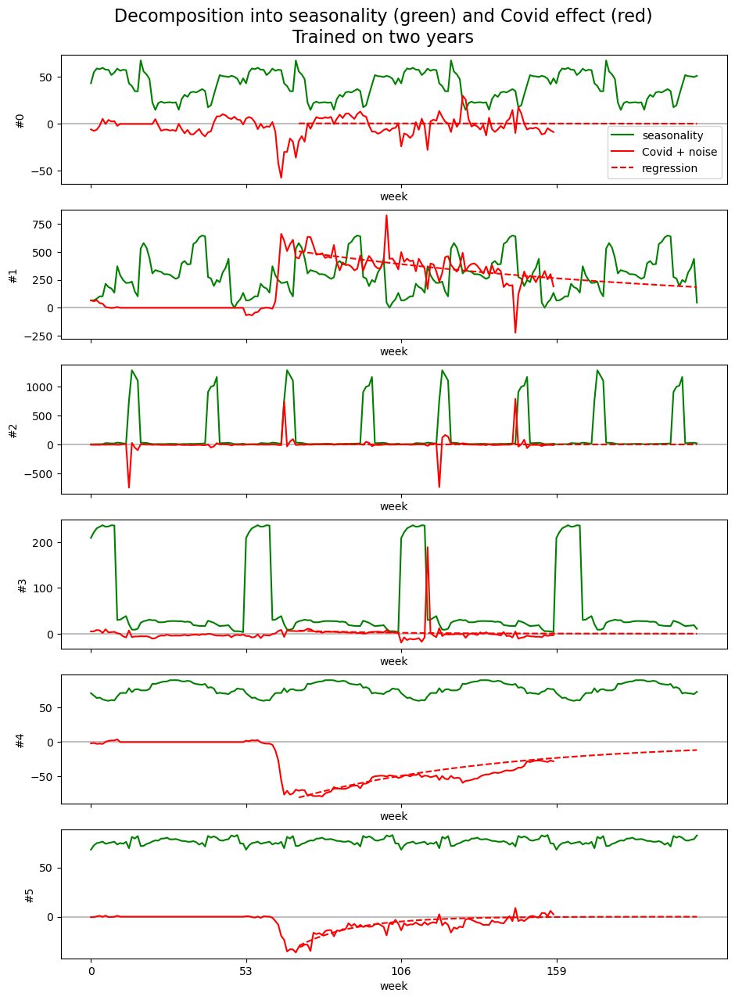

# Training RMSE: 6.97
# Validation RMSE: 17.79


In [326]:
def decompose_seasonal_covid(test_start):
    """Decompose the NMF components into seasonality and Covid effect.
    Print the coefficients of the recovery function.
    Plot decomposition and forecast.
    Compute RMSE or write submission file depending on test_start.
    
    Weeks [:test_start] are used for training, weeks[teststart:] are used for validation.
    """
    assert nmf.components_.shape[1] == 159 # 159 weeks in training data
    assert test_start == 106 or test_start == 159
    n_components = len(nmf.components_)

    # For determining the seasonality, the following weeks are considered outliers:
    if n_components == 6:
        covid_weeks = {0: np.arange(63, 75),
                       1: np.arange(63, 159),
                       2: [],
                       3: [],
                       4: np.arange(63, 159),
                       5: np.arange(63, 159)}

    z_tr_pred = np.full((test_start-71, n_components), np.nan) # part of 2020 and 2021
    z_va_pred = np.full((53, n_components), np.nan) # 53 weeks in 2021
    z_te_pred = np.full((49, n_components), np.nan) # 49 weeks in 2022
    _, axes = plt.subplots(n_components, 1, figsize=(11, n_components*2.5),
                           sharex=True, squeeze=False)
    for i, ax in enumerate(axes[:n_components]):
        # Get the time series (blue)
        comp = nmf.components_[i].copy()
    #     ax[0].plot(comp, 'b')

        # Determine the seasonality (green) based on the unaffected regions
        comp_unaffected = comp.copy()
        comp_unaffected[covid_weeks[i]] = np.nan
        comp_unaffected = comp_unaffected[:test_start]
        comp_unaffected = comp_unaffected.reshape(-1, 53)
        seasonality = np.nanmean(comp_unaffected, axis=0)
        seasonality = np.tile(seasonality, 4)
        ax[0].plot(seasonality[:159+49], 'g', label='seasonality')

        # Determine and plot the training data without seasonality (red)
        comp -= seasonality[:len(comp)]
        ax[0].axhline(0, color='gray', alpha=0.5)
        ax[0].plot(comp.ravel(), 'r', label='Covid + noise')

        # Fit an exponential curve to the Covid recovery region
        # and plot it (red dashed line)
        def obj(x):
            """
            Loss function to be minimized

            x[0] = a = emission at week 71
            x[1] = T = time constant for exponential decay
            returns: training mse
            """
            a, T = x
            y_pred = a * np.exp(- np.arange(0, test_start-71) / T)
            loss = mean_squared_error(comp[71:test_start], y_pred)
            return loss

        x0 = np.array([0, 40]) # initial a and T
        bounds = ((-1e4, 1e4), (15, 1e6)) # T must be > 0
        res = minimize(obj, x0, method='Powell', bounds=bounds, tol=0.0001)
        a, T = res.x # optimal values
        print(f"#{i}: a = {a:5.0f}   T = {T:7.0f}   tr-loss = {res.fun:5.0f}")
        ax[0].plot(np.arange(71, 159+49), a * np.exp(- np.arange(0, 159+49-71) / T),
                   'r--', label='regression')

        # Compute predictions for the component as sum of exponential regression line and seasonality
        z_pred = a * np.exp(- np.arange(0, 159+49-71) / T) + seasonality[71:159+49]

        # Predict the training labels
        z_tr_pred[:, i] = z_pred[:test_start-71]

        # Predict and plot the final year (blue dashed line)
        z_va_pred[:, i] = z_pred[106-71:159-71]
        z_te_pred[:, i] = z_pred[159-71:159+49-71]
    #     ax[0].plot(np.arange(71, 159+49), z_pred, 'b--')

        ax[0].set_xticks([0, 53, 106, 159])
        ax[0].set_ylabel(f"#{i}")
        ax[0].set_xlabel(f"week")

    # Finish the plot
    axes[0, 0].legend()
    plt.suptitle('Decomposition into seasonality (green) and Covid effect (red)\n' +
                 ('Trained on two years' if test_start == 106 else 'Trained on three years'),
                 fontsize=16, y=0.92)
#     plt.savefig(f'seasonal+covid-{test_start//53}')
    plt.show()
    
    # Compute training score (RMSE)
    y_tr_pred = embedding.values @ z_tr_pred.T # inverse of NMF, shape (479, test_start-71)
    rmse = mean_squared_error(X.values[:,71:test_start].ravel(), y_tr_pred.ravel(), squared=False)
    print(f"{Fore.GREEN}{Style.BRIGHT}# Training RMSE: {rmse:.2f}{Style.RESET_ALL}")
    
    if test_start == 106: 
        # Compute validation score (RMSE)
        y_va_pred = embedding.values @ z_va_pred.T # inverse of NMF, shape (479, 53)
        rmse = mean_squared_error(X.values[:,test_start:].ravel(), y_va_pred.ravel(), squared=False)
        print(f"{Fore.GREEN}{Style.BRIGHT}# Validation RMSE: {rmse:.2f}{Style.RESET_ALL}")
    else:
        # Create submission
        y_te_pred = embedding.values @ z_te_pred.T # inverse of NMF, shape (479, 49)
        submission = pd.Series(y_te_pred.ravel(), name='emission', index=test.index)
        submission.to_csv('submission.csv')
        display(submission)

decompose_seasonal_covid(test_start=106) # 106 weeks = 2 years

The diagram above uses 2019 and 2020 as training data and validates with 2021, giving a validation RMSE of 17.79 (better than the baseline model, which has RMSE = 19.77 for 2021). We now refit the model to the complete training data and generate a submission file.

The red lines in the diagram show:

* Components #2 and #3 are stationary with a few apparently unpredictable peaks.
* Component #0 has a short Covid shock in week 63 with rapid recovery before week 75.
* Components #4 and #5 have Covid shocks (reduced emissions) in week 63 with slow recovery.
* Component #1 has an inverse Covid shock (increased emissions) with slow recovery.

Important for a successful implementation of this model is a generous outlier handling. When the seasonal component is modeled, all weeks affected by Covid are defined as outliers:

In [ ]:
# covid_weeks = {0: np.arange(63, 75),
#                1: np.arange(63, 159),
#                2: [],
#                3: [],
#                4: np.arange(63, 159),
#                5: np.arange(63, 159)}

While fitting the exponential function, we look only at week 71 and later (i.e. weeks 0 through 70 do not belong to the Covid recovery phase and are dropped before training).


A major advantage of this model is that it can be validated: We can train it on the first two years and validate it on 2021. This validation gives an RMSE of 17.79.

#0: a =    -1   T =      80   tr-loss =    60
#1: a =   520   T =     119   tr-loss =  9312
#2: a =    -4   T =      21   tr-loss =  6948
#3: a =     8   T =      24   tr-loss =   197
#4: a =   -76   T =     108   tr-loss =    35
#5: a =   -25   T =      30   tr-loss =    18


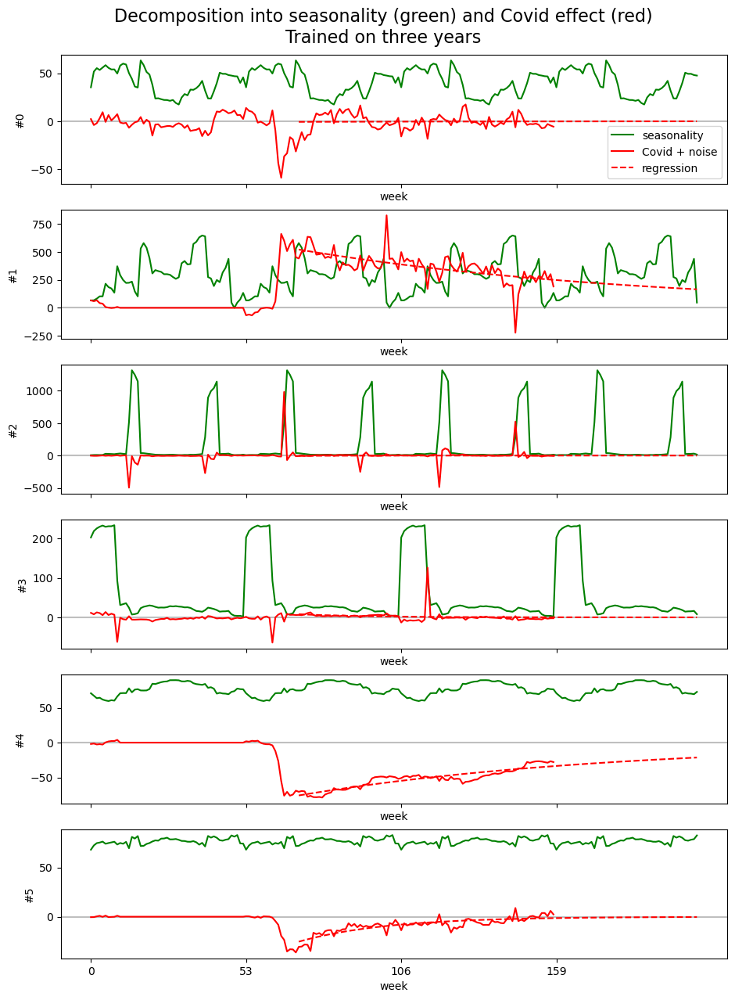

# Training RMSE: 10.73


ID_LAT_LON_YEAR_WEEK
ID_-0.510_29.290_2022_00     3.855470
ID_-0.510_29.290_2022_01     4.115436
ID_-0.510_29.290_2022_02     4.249784
ID_-0.510_29.290_2022_03     4.298661
ID_-0.510_29.290_2022_04     4.345684
                              ...    
ID_-3.299_30.301_2022_44    29.314774
ID_-3.299_30.301_2022_45    29.640324
ID_-3.299_30.301_2022_46    30.166034
ID_-3.299_30.301_2022_47    30.709450
ID_-3.299_30.301_2022_48    28.903129
Name: emission, Length: 24353, dtype: float64

In [328]:
decompose_seasonal_covid(test_start=159) # 159 weeks = 3 years